<h1 style='color:white; background:#50A8E3; border:0'><center>Water aquifer over extraction predictions (Future water depth)</center></h1>


**The datasets used were provided by The Acea Group one of the leading Italian multiutility operators. Listed on the Italian Stock Exchange since 1999, the company manages and develops water and electricity networks and environmental services. Acea is the foremost Italian operator in the water services sector supplying 9 million inhabitants in Lazio, Tuscany, Umbria, Molise, Campania.**

**This data set contains nine different datasets, completely independent and not linked to each other. Each dataset can represent a different kind of waterbody. As each waterbody is different from the other, the related features as well are different from each other.
only 4 were used as we chose to focus on water aquifer over extraction**


* EDA
* Feature Engineering
* Predictions


In [92]:
# loading packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import seaborn as sns
plt.rcParams['figure.dpi'] = 300

import matplotlib.dates as mdates

from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor

# ignoring warnings
import warnings
warnings.simplefilter("ignore")

#Loading and a first look at the data



In [93]:
print('Datasets:')
os.listdir('acea-water-prediction')

Datasets:


['Aquifer_Petrignano.csv',
 'datasets_description.ods',
 'Water_Spring_Madonna_di_Canneto.csv',
 'Water_Spring_Amiata.csv',
 'datasets_description.xlsx',
 'Aquifer_Auser.csv',
 'Aquifer_Luco.csv',
 'Water_Spring_Lupa.csv',
 'Aquifer_Doganella.csv',
 'River_Arno.csv',
 'Lake_Bilancino.csv']

In [94]:
Aquifer_Doganella = pd.read_csv('acea-water-prediction/Aquifer_Doganella.csv', index_col = 'Date')
Aquifer_Auser = pd.read_csv('acea-water-prediction/Aquifer_Auser.csv', index_col = 'Date')
Aquifer_Luco = pd.read_csv('acea-water-prediction/Aquifer_Luco.csv', index_col = 'Date')
Aquifer_Petrignano = pd.read_csv('acea-water-prediction/Aquifer_Petrignano.csv', index_col = 'Date')


print('Datasets shape:')
print('*'*30)
print('Aquifer_Doganella: {}'.format(Aquifer_Doganella.shape))
print('Aquifer_Auser: {}'.format(Aquifer_Auser.shape))
print('Aquifer_Luco: {}'.format(Aquifer_Luco.shape))
print('Aquifer_Petrignano: {}'.format(Aquifer_Petrignano.shape))

Datasets shape:
******************************
Aquifer_Doganella: (6026, 21)
Aquifer_Auser: (8154, 26)
Aquifer_Luco: (7487, 21)
Aquifer_Petrignano: (5223, 7)


In [95]:
datasets = [Aquifer_Doganella, Aquifer_Auser, Aquifer_Luco,
            Aquifer_Petrignano]

datasets_names = ['Aquifer_Doganella', 'Aquifer_Auser', 'Aquifer_Luco',
                'Aquifer_Petrignano']

In [96]:
print('Datasets dtypes:')
print('*'*30)
for i in range(len(datasets)):
    print('{}: \n{}'.format(datasets_names[i], datasets[i].dtypes.value_counts()))
    print('-'*20)

Datasets dtypes:
******************************
Aquifer_Doganella: 
float64    21
Name: count, dtype: int64
--------------------
Aquifer_Auser: 
float64    26
Name: count, dtype: int64
--------------------
Aquifer_Luco: 
float64    21
Name: count, dtype: int64
--------------------
Aquifer_Petrignano: 
float64    7
Name: count, dtype: int64
--------------------


#EDA

In [97]:
def bar_plot(x, y, title, palette_len, xlim = None, ylim = None,
             xticklabels = None, yticklabels = None,
             top_visible = False, right_visible = False,
             bottom_visible = True, left_visible = False,
             xlabel = None, ylabel = None, figsize = (10, 4),
             axis_grid = 'y'):
    fig, ax = plt.subplots(figsize = figsize)
    plt.title(title, size = 15, fontweight = 'bold', fontfamily = 'serif')

    for i in ['top', 'right', 'bottom', 'left']:
        ax.spines[i].set_color('black')

    ax.spines['top'].set_visible(top_visible)
    ax.spines['right'].set_visible(right_visible)
    ax.spines['bottom'].set_visible(bottom_visible)
    ax.spines['left'].set_visible(left_visible)

    sns.barplot(x = x, y = y, edgecolor = 'black', ax = ax,
                palette = reversed(sns.color_palette("viridis", len(palette_len))))
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    ax.set_xticklabels(xticklabels, fontfamily = 'serif')
    ax.set_yticklabels(yticklabels, fontfamily = 'serif')
    plt.xlabel(xlabel, fontfamily = 'serif')
    plt.ylabel(ylabel, fontfamily = 'serif')
    ax.grid(axis = axis_grid, linestyle = '--', alpha = 0.9)
    plt.show()

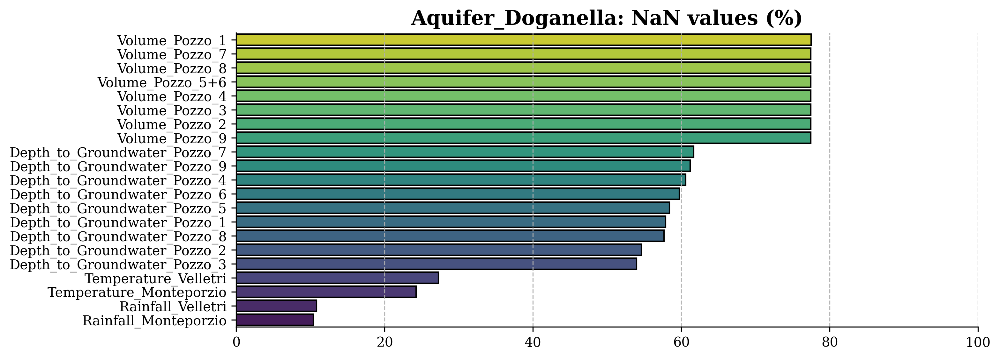

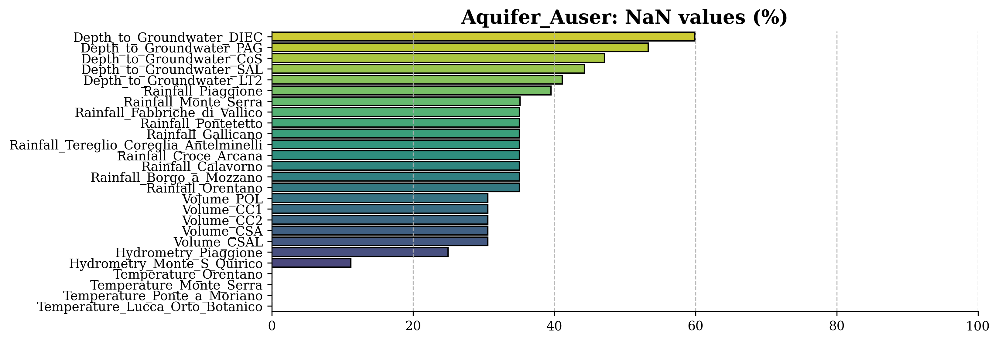

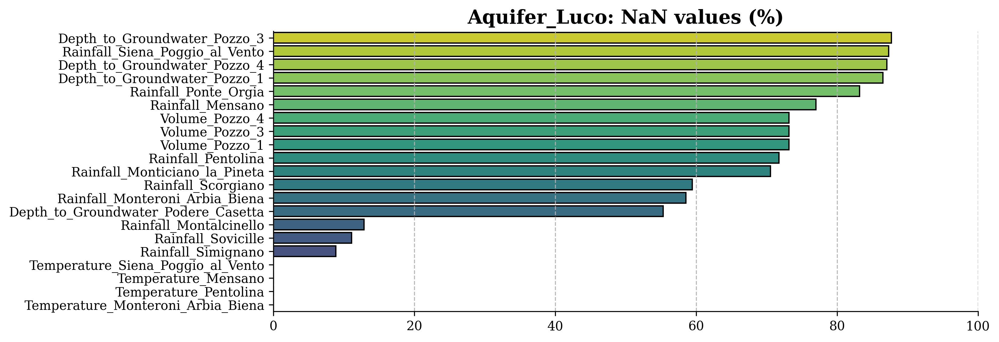

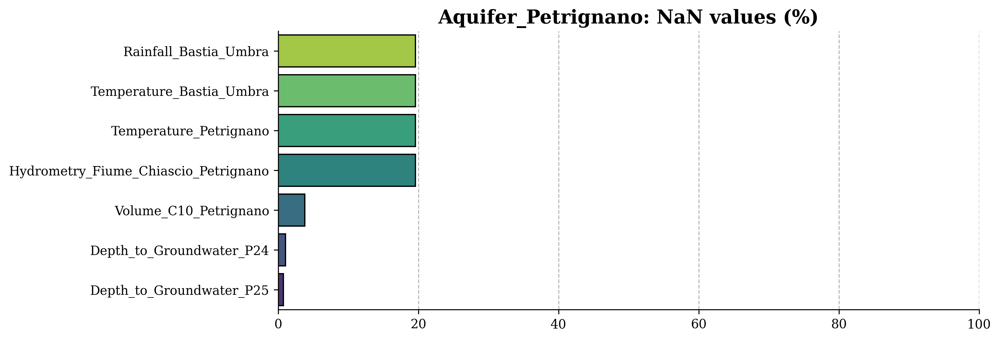

In [98]:
for i in range(len(datasets)):
    NaN_values = (datasets[i].isnull().sum() / len(datasets[i]) * 100).sort_values(ascending = False)
    bar_plot(x = NaN_values,
             y = NaN_values.index,
             title = '{}: NaN values (%)'.format(datasets_names[i]),
             palette_len = NaN_values.index,
             xlim = (0, 100),
             xticklabels = range(0, 101, 20),
             yticklabels = NaN_values.index,
             left_visible = True,
             figsize = ((10), 4), axis_grid = 'x')

In [99]:
def line_plot(data, y, title, color,
              top_visible = False, right_visible = False,
              bottom_visible = True, left_visible = False,
              ylabel = None, figsize = (10, 4), axis_grid = 'y'):
    fig, ax = plt.subplots(figsize = figsize)
    plt.title(title, size = 15, fontweight = 'bold', fontfamily = 'serif')

    for i in ['top', 'right', 'bottom', 'left']:
        ax.spines[i].set_color('black')

    ax.spines['top'].set_visible(top_visible)
    ax.spines['right'].set_visible(right_visible)
    ax.spines['bottom'].set_visible(bottom_visible)
    ax.spines['left'].set_visible(left_visible)

    sns.lineplot(x = range(len(data[y])), y = data[y], dashes = False,
                 color = color, linewidth = .5)
    ax.xaxis.set_major_locator(plt.MaxNLocator(20))

    ax.set_xticks([])
    plt.xticks(rotation = 90)
    plt.xlabel('')
    plt.ylabel(ylabel, fontfamily = 'serif')
    ax.grid(axis = axis_grid, linestyle = '--', alpha = 0.9)
    plt.show()

def corr_plot(data,
              top_visible = False, right_visible = False,
              bottom_visible = True, left_visible = False,
              ylabel = None, figsize = (15, 11), axis_grid = 'y'):
    fig, ax = plt.subplots(figsize = figsize)
    plt.title('Correlations', size = 15, fontweight = 'bold', fontfamily = 'serif')

    mask = np.triu(np.ones_like(data.corr(), dtype = bool))
    sns.heatmap(round(data.corr(), 2), mask = mask, cmap = 'viridis', annot = True)
    plt.show()

def columns_viz(data, color):
    for i in range(len(data.columns)):
        line_plot(data = data, y = data.columns[i],
                  color = color,
                  title = '{} dynamics'.format(data.columns[i]),
                  bottom_visible = False, figsize = (10, 2))

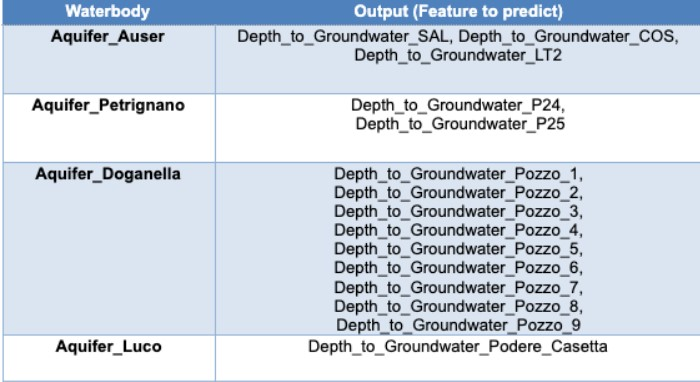

##Aquifer Doganella


Description: The wells field Doganella is fed by two underground aquifers not fed by rivers or lakes but fed by meteoric infiltration. The upper aquifer is a water table with a thickness of about 30m. The lower aquifer is a semi-confined artesian aquifer with a thickness of 50m and is located inside lavas and tufa products. These aquifers are accessed through wells called Well 1, ..., Well 9. Approximately 80% of the drainage volumes come from the artesian aquifer. The aquifer levels are influenced by the following parameters: rainfall, humidity, subsoil, temperatures and drainage volumes.

In [100]:
datasets[0].head()

,Rainfall_Monteporzio,Rainfall_Velletri,Depth_to_Groundwater_Pozzo_1,Depth_to_Groundwater_Pozzo_2,Depth_to_Groundwater_Pozzo_3,Depth_to_Groundwater_Pozzo_4,Depth_to_Groundwater_Pozzo_5,Depth_to_Groundwater_Pozzo_6,Depth_to_Groundwater_Pozzo_7,Depth_to_Groundwater_Pozzo_8,...,Volume_Pozzo_1,Volume_Pozzo_2,Volume_Pozzo_3,Volume_Pozzo_4,Volume_Pozzo_5+6,Volume_Pozzo_7,Volume_Pozzo_8,Volume_Pozzo_9,Temperature_Monteporzio,Temperature_Velletri
Date,,,,,,,,,,,,,,,,,,,,,
01/01/2004,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.30,8.60
02/01/2004,0.2,0.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.70,6.25
03/01/2004,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.40,9.80
04/01/2004,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.35,5.95
05/01/2004,0.2,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.60,5.85


In [101]:
print('The earliest date: \t%s' %datasets[0].index.values[[0, -1]][0])
print('The latest date: \t%s' %datasets[0].index.values[[0, -1]][1])

The earliest date: 	01/01/2004
The latest date: 	30/06/2020


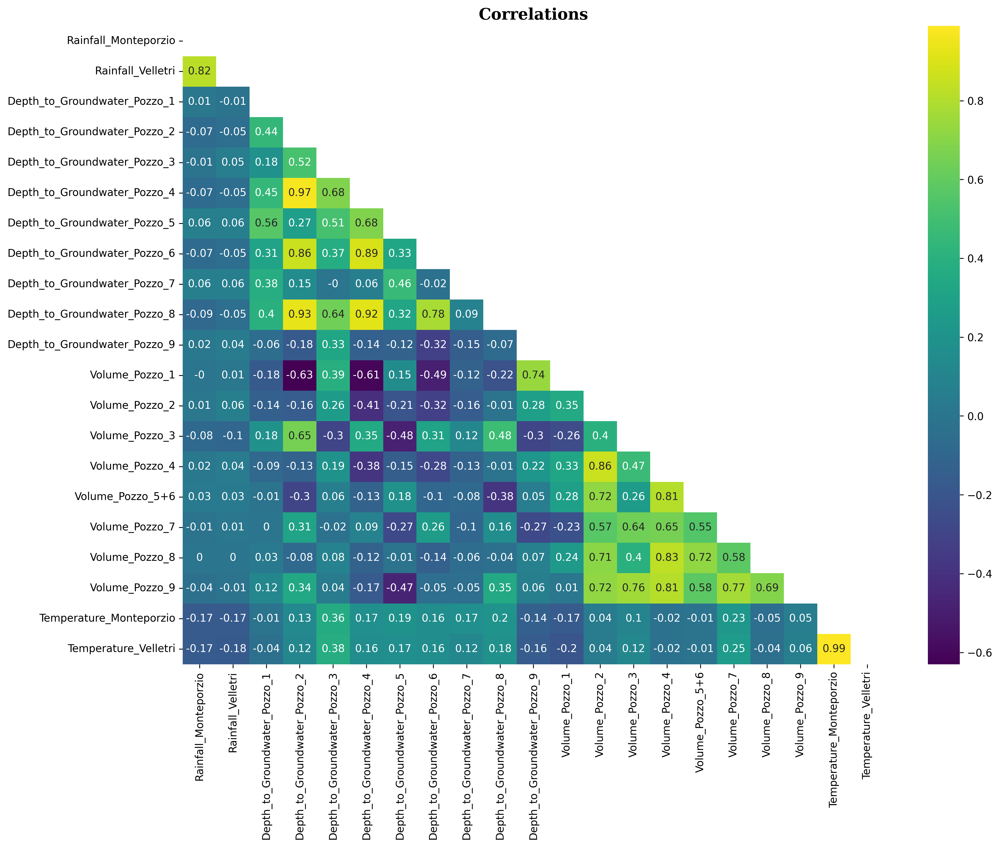

In [102]:
corr_plot(datasets[0])

##Aquifer Auser

Description: This waterbody consists of two subsystems, called NORTH and SOUTH, where the former partly influences the behavior of the latter. Indeed, the north subsystem is a water table (or unconfined) aquifer while the south subsystem is an artesian (or confined) groundwater.

The levels of the NORTH sector are represented by the values of the SAL, PAG, CoS and DIEC wells, while the levels of the SOUTH sector by the LT2 well.

In [103]:
datasets[1].head()

,Rainfall_Gallicano,Rainfall_Pontetetto,Rainfall_Monte_Serra,Rainfall_Orentano,Rainfall_Borgo_a_Mozzano,Rainfall_Piaggione,Rainfall_Calavorno,Rainfall_Croce_Arcana,Rainfall_Tereglio_Coreglia_Antelminelli,Rainfall_Fabbriche_di_Vallico,...,Temperature_Monte_Serra,Temperature_Ponte_a_Moriano,Temperature_Lucca_Orto_Botanico,Volume_POL,Volume_CC1,Volume_CC2,Volume_CSA,Volume_CSAL,Hydrometry_Monte_S_Quirico,Hydrometry_Piaggione
Date,,,,,,,,,,,,,,,,,,,,,
05/03/1998,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
06/03/1998,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,10.05,NaN,NaN,NaN,NaN,NaN,NaN,NaN
07/03/1998,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,9.2,0.0,10.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
08/03/1998,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,11.4,0.0,13.85,NaN,NaN,NaN,NaN,NaN,NaN,NaN
09/03/1998,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,11.4,0.0,12.85,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [104]:
print('The earliest date: \t%s' %datasets[1].index.values[[0, -1]][0])
print('The latest date: \t%s' %datasets[1].index.values[[0, -1]][1])

The earliest date: 	05/03/1998
The latest date: 	30/06/2020


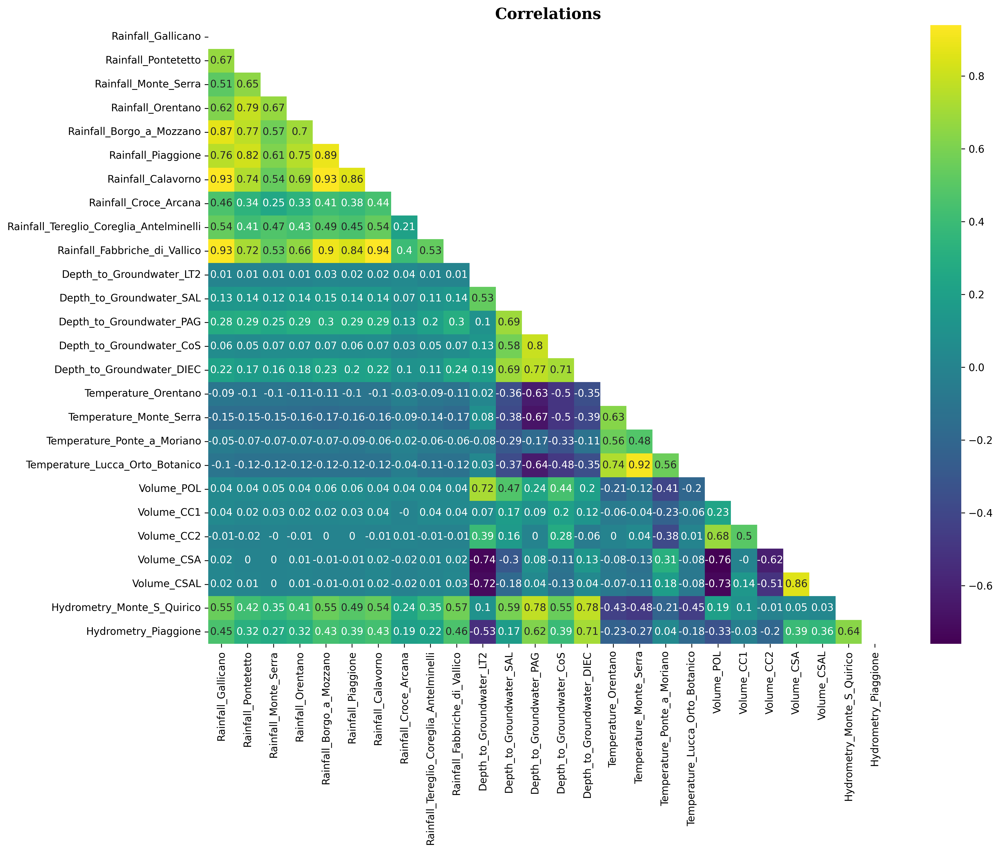

In [105]:
corr_plot(datasets[1])

##Aquifer Luco

Description: The Luco wells field is fed by an underground aquifer. This aquifer not fed by rivers or lakes but by meteoric infiltration at the extremes of the impermeable sedimentary layers. Such aquifer is accessed through wells called Well 1, Well 3 and Well 4 and is influenced by the following parameters: rainfall, depth to groundwater, temperature and drainage volumes.

In [114]:
datasets[2].head()

,Rainfall_Simignano,Rainfall_Siena_Poggio_al_Vento,Rainfall_Mensano,Rainfall_Montalcinello,Rainfall_Monticiano_la_Pineta,Rainfall_Sovicille,Rainfall_Ponte_Orgia,Rainfall_Scorgiano,Rainfall_Pentolina,Rainfall_Monteroni_Arbia_Biena,...,Depth_to_Groundwater_Pozzo_1,Depth_to_Groundwater_Pozzo_3,Depth_to_Groundwater_Pozzo_4,Temperature_Siena_Poggio_al_Vento,Temperature_Mensano,Temperature_Pentolina,Temperature_Monteroni_Arbia_Biena,Volume_Pozzo_1,Volume_Pozzo_3,Volume_Pozzo_4
Date,,,,,,,,,,,,,,,,,,,,,
01/01/2000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.0,0.0,5.50,0.80,NaN,NaN,NaN
02/01/2000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.0,0.0,6.20,3.25,NaN,NaN,NaN
03/01/2000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.0,0.0,7.25,0.95,NaN,NaN,NaN
04/01/2000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.0,0.0,7.00,4.20,NaN,NaN,NaN
05/01/2000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.0,0.0,7.90,6.55,NaN,NaN,NaN


In [115]:
print('The earliest date: \t%s' %datasets[2].index.values[[0, -1]][0])
print('The latest date: \t%s' %datasets[2].index.values[[0, -1]][1])

The earliest date: 	01/01/2000
The latest date: 	30/06/2020


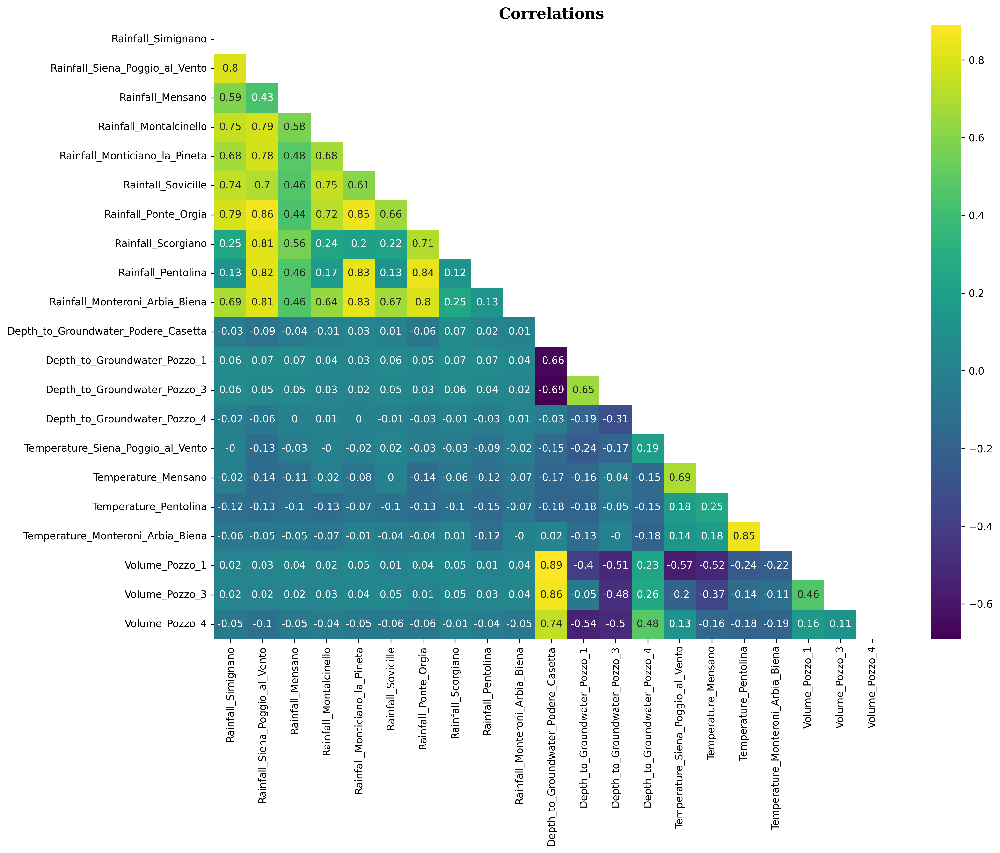

In [116]:
corr_plot(datasets[2])

##Aquifer Petrignano


Description: The wells field of the alluvial plain between Ospedalicchio di Bastia Umbra and Petrignano is fed by three underground aquifers separated by low permeability septa. The aquifer can be considered a water table groundwater and is also fed by the Chiascio river. The groundwater levels are influenced by the following parameters: rainfall, depth to groundwater, temperatures and drainage volumes, level of the Chiascio river.

In [117]:
datasets[3].head()

,Rainfall_Bastia_Umbra,Depth_to_Groundwater_P24,Depth_to_Groundwater_P25,Temperature_Bastia_Umbra,Temperature_Petrignano,Volume_C10_Petrignano,Hydrometry_Fiume_Chiascio_Petrignano
Date,,,,,,,
14/03/2006,NaN,-22.48,-22.18,NaN,NaN,NaN,NaN
15/03/2006,NaN,-22.38,-22.14,NaN,NaN,NaN,NaN
16/03/2006,NaN,-22.25,-22.04,NaN,NaN,NaN,NaN
17/03/2006,NaN,-22.38,-22.04,NaN,NaN,NaN,NaN
18/03/2006,NaN,-22.60,-22.04,NaN,NaN,NaN,NaN


In [118]:
print('The earliest date: \t%s' %datasets[3].index.values[[0, -1]][0])
print('The latest date: \t%s' %datasets[3].index.values[[0, -1]][1])

The earliest date: 	14/03/2006
The latest date: 	30/06/2020


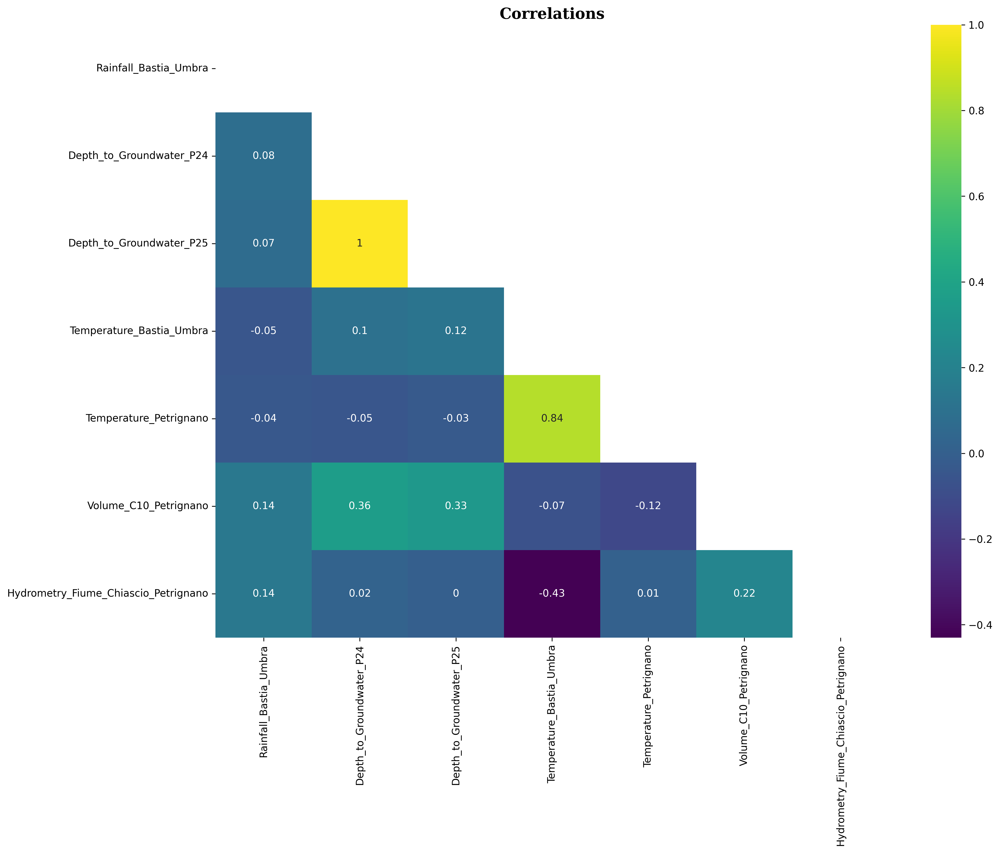

In [119]:
corr_plot(datasets[3])

#Feature overview and prediction


##Aquifer Petrignano (features)


![](https://www.researchgate.net/profile/Elisabetta_Preziosi/publication/26812692/figure/fig8/AS:279197076475915@1443577178810/The-Petrignano-dAssisi-plain-Gray-areas-alluvial-deposits-White-areas-lacustrine-and.png)
(Source: [The Sustainable Pumping Rate Concept: Lessons from a Case Study in Central Italy](https://www.researchgate.net/publication/26812692_The_Sustainable_Pumping_Rate_Concept_Lessons_from_a_Case_Study_in_Central_Italy))

Gray areas: alluvial deposits. White areas: lacustrine and fluvio-lacustrine deposits. White stars: wells belonging to the Petrignano pumping station. Black dots: other wells located within the area. The bold line indicates the boundaries of the model area.

In [120]:
df = Aquifer_Petrignano.reset_index().copy()
df['year'] = pd.to_datetime(df.Date).dt.year
df['month'] = pd.to_datetime(df.Date).dt.month

# Monthly dynamics
df['month_year'] = pd.to_datetime(df.Date).apply(lambda x: x.strftime('%Y/%m'))

ap_means_P24 = df.groupby('month_year').Depth_to_Groundwater_P24.mean().reset_index()
ap_means_P24['month_year'] = pd.to_datetime(ap_means_P24['month_year'])

ap_means_P25 = df.groupby('month_year').Depth_to_Groundwater_P25.mean().reset_index()
ap_means_P25['month_year'] = pd.to_datetime(ap_means_P25['month_year'])

ap_rain = df.groupby('month_year').Rainfall_Bastia_Umbra.mean().reset_index()
ap_rain['month_year'] = pd.to_datetime(ap_rain['month_year'])

ap_temp_B = df.groupby('month_year').Temperature_Bastia_Umbra.mean().reset_index()
ap_temp_B['month_year'] = pd.to_datetime(ap_temp_B['month_year'])

ap_temp_P = df.groupby('month_year').Temperature_Petrignano.mean().reset_index()
ap_temp_P['month_year'] = pd.to_datetime(ap_temp_P['month_year'])

ap_C10 = df.groupby('month_year').Volume_C10_Petrignano.mean().reset_index()
ap_C10['month_year'] = pd.to_datetime(ap_C10['month_year'])

ap_hydro = df.groupby('month_year').Hydrometry_Fiume_Chiascio_Petrignano.mean().reset_index()
ap_hydro['month_year'] = pd.to_datetime(ap_hydro['month_year'])

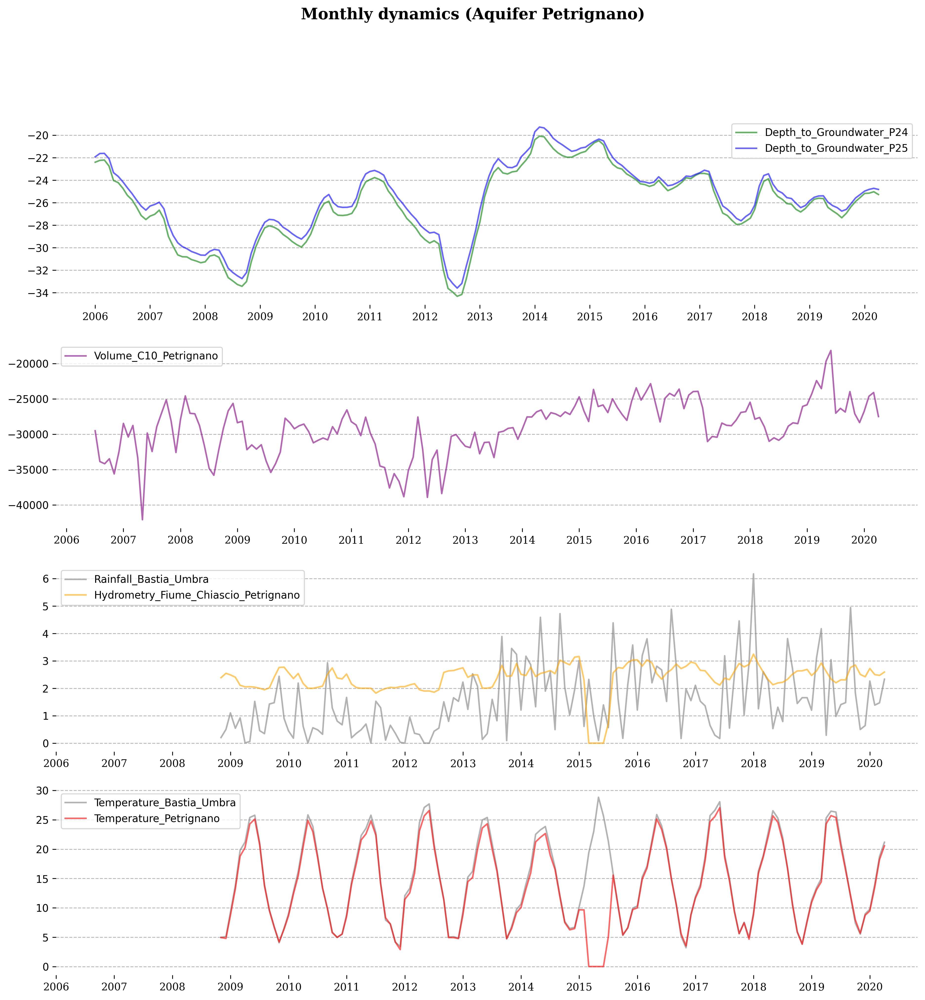

In [121]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize = (15, 15))
plt.suptitle('Monthly dynamics (Aquifer Petrignano)', size = 15, fontweight = 'bold', fontfamily = 'serif')

sns.lineplot(data = ap_means_P24, x = 'month_year', y = 'Depth_to_Groundwater_P24',
             color = 'green', label = 'Depth_to_Groundwater_P24', alpha = 0.6,
             ax = ax1)
sns.lineplot(data = ap_means_P25, x = 'month_year', y = 'Depth_to_Groundwater_P25',
             color = 'blue', label = 'Depth_to_Groundwater_P25', alpha = 0.6,
             ax = ax1)

for i in ['top', 'right', 'bottom', 'left']:
        ax1.spines[i].set_visible(False)

ax1.set_xticks(ap_temp_B.month_year[::12])
ax1.set_xticklabels(range(2006, 2021, 1), fontfamily = 'serif')
ax1.set_xlabel('')
ax1.set_ylabel('')
ax1.grid(axis = 'y', linestyle = '--', alpha = 0.9)


sns.lineplot(data = ap_temp_B, x = 'month_year', y = 'Temperature_Bastia_Umbra',
             color = 'gray', label = 'Temperature_Bastia_Umbra', alpha = 0.6,
             ax = ax4)
sns.lineplot(data = ap_temp_P, x = 'month_year', y = 'Temperature_Petrignano',
             color = 'red', label = 'Temperature_Petrignano', alpha = 0.6,
             ax = ax4)

for i in ['top', 'right', 'bottom', 'left']:
        ax4.spines[i].set_visible(False)

ax4.set_xticks(ap_temp_P.month_year[::12])
ax4.set_xticklabels(range(2006, 2021, 1), fontfamily = 'serif')
ax4.set_xlabel('')
ax4.set_ylabel('')
ax4.grid(axis = 'y', linestyle = '--', alpha = 0.9)


sns.lineplot(data = ap_rain, x = 'month_year', y = 'Rainfall_Bastia_Umbra',
             color = 'grey', label = 'Rainfall_Bastia_Umbra', alpha = 0.6,
             ax = ax3)
sns.lineplot(data = ap_hydro, x = 'month_year', y = 'Hydrometry_Fiume_Chiascio_Petrignano',
             color = 'orange', label = 'Hydrometry_Fiume_Chiascio_Petrignano', alpha = 0.6,
             ax = ax3)

for i in ['top', 'right', 'bottom', 'left']:
        ax3.spines[i].set_visible(False)

ax3.set_xticks(ap_rain.month_year[::12])
ax3.set_xticklabels(range(2006, 2021, 1), fontfamily = 'serif')
ax3.set_xlabel('')
ax3.set_ylabel('')
ax3.grid(axis = 'y', linestyle = '--', alpha = 0.9)


sns.lineplot(data = ap_C10, x = 'month_year', y = 'Volume_C10_Petrignano',
             color = 'purple', label = 'Volume_C10_Petrignano', alpha = 0.6,
             ax = ax2)

for i in ['top', 'right', 'bottom', 'left']:
        ax2.spines[i].set_visible(False)

ax2.set_xticks(ap_C10.month_year[::12])
ax2.set_xticklabels(range(2006, 2021, 1), fontfamily = 'serif')
ax2.set_xlabel('')
ax2.set_ylabel('')
ax2.grid(axis = 'y', linestyle = '--', alpha = 0.9)
plt.show()

Depth_to_Groundwater_P24 and Depth_to_Groundwater_P25 are completely correlated, and therefore averaged values can be used.

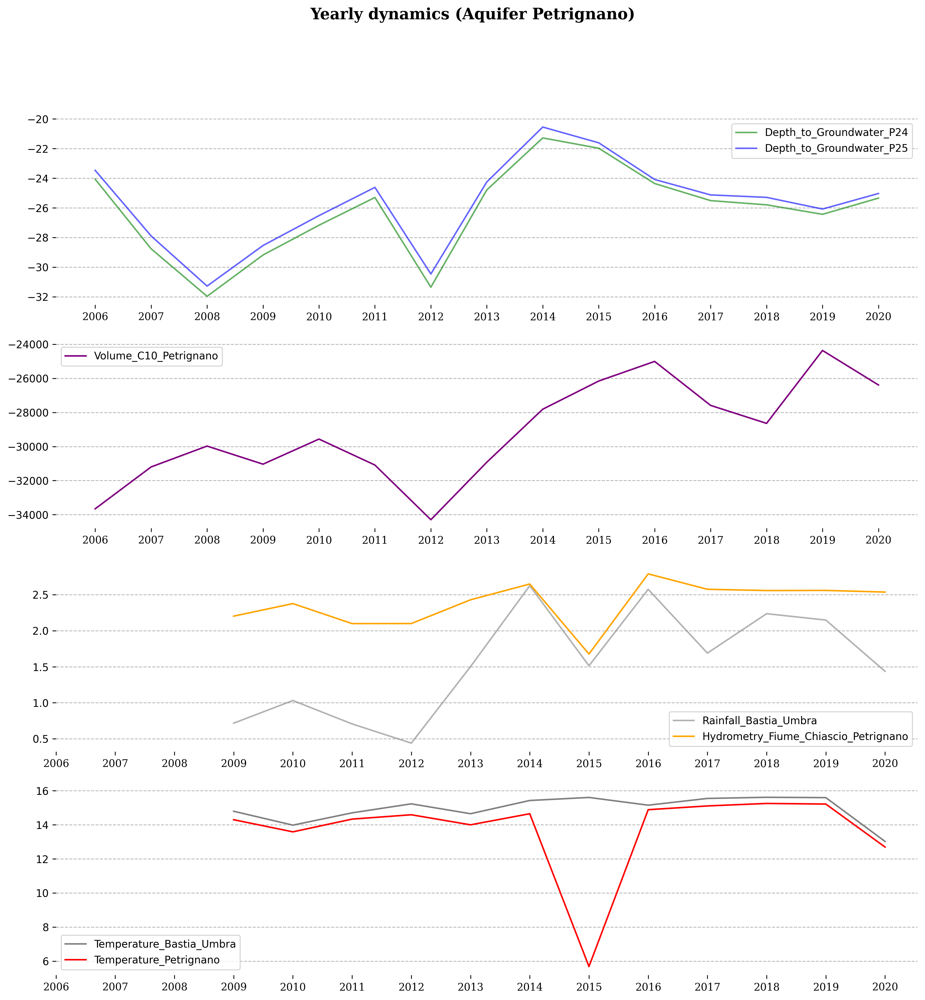

In [122]:
# Yearly dynamics
ap_means_P24_y = df.groupby('year').Depth_to_Groundwater_P24.mean().reset_index()
ap_means_P25_y = df.groupby('year').Depth_to_Groundwater_P25.mean().reset_index()
ap_rain_y = df.groupby('year').Rainfall_Bastia_Umbra.mean().reset_index()
ap_temp_B_y = df.groupby('year').Temperature_Bastia_Umbra.mean().reset_index()
ap_temp_P_y = df.groupby('year').Temperature_Petrignano.mean().reset_index()
ap_C10_y = df.groupby('year').Volume_C10_Petrignano.mean().reset_index()
ap_hydro_y = df.groupby('year').Hydrometry_Fiume_Chiascio_Petrignano.mean().reset_index()


fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize = (15, 15))
plt.suptitle('Yearly dynamics (Aquifer Petrignano)', size = 15, fontweight = 'bold', fontfamily = 'serif')

sns.lineplot(data = ap_means_P24_y, x = 'year', y = 'Depth_to_Groundwater_P24',
             color = 'green', label = 'Depth_to_Groundwater_P24', alpha = 0.6,
             ax = ax1)
sns.lineplot(data = ap_means_P25_y, x = 'year', y = 'Depth_to_Groundwater_P25',
             color = 'blue', label = 'Depth_to_Groundwater_P25', alpha = 0.6,
             ax = ax1)

for i in ['top', 'right', 'bottom', 'left']:
        ax1.spines[i].set_visible(False)

ax1.set_xticks(ap_temp_B_y.year[::1])
ax1.set_xticklabels(range(2006, 2021, 1), fontfamily = 'serif')
ax1.set_xlabel('')
ax1.set_ylabel('')
ax1.grid(axis = 'y', linestyle = '--', alpha = 0.9)


sns.lineplot(data = ap_temp_B_y, x = 'year', y = 'Temperature_Bastia_Umbra',
             color = 'gray', label = 'Temperature_Bastia_Umbra', alpha = 1,
             ax = ax4)
sns.lineplot(data = ap_temp_P_y, x = 'year', y = 'Temperature_Petrignano',
             color = 'red', label = 'Temperature_Petrignano', alpha = 1,
             ax = ax4)

for i in ['top', 'right', 'bottom', 'left']:
        ax4.spines[i].set_visible(False)

ax4.set_xticks(ap_temp_P_y.year[::1])
ax4.set_xticklabels(range(2006, 2021, 1), fontfamily = 'serif')
ax4.set_xlabel('')
ax4.set_ylabel('')
ax4.grid(axis = 'y', linestyle = '--', alpha = 0.9)


sns.lineplot(data = ap_rain_y, x = 'year', y = 'Rainfall_Bastia_Umbra',
             color = 'grey', label = 'Rainfall_Bastia_Umbra', alpha = 0.6,
             ax = ax3)
sns.lineplot(data = ap_hydro_y, x = 'year', y = 'Hydrometry_Fiume_Chiascio_Petrignano',
             color = 'orange', label = 'Hydrometry_Fiume_Chiascio_Petrignano', alpha = 1,
             ax = ax3)

for i in ['top', 'right', 'bottom', 'left']:
        ax3.spines[i].set_visible(False)

ax3.set_xticks(ap_rain_y.year[::1])
ax3.set_xticklabels(range(2006, 2021, 1), fontfamily = 'serif')
ax3.set_xlabel('')
ax3.set_ylabel('')
ax3.grid(axis = 'y', linestyle = '--', alpha = 0.9)


sns.lineplot(data = ap_C10_y, x = 'year', y = 'Volume_C10_Petrignano',
             color = 'purple', label = 'Volume_C10_Petrignano', alpha = 1,
             ax = ax2)

for i in ['top', 'right', 'bottom', 'left']:
        ax2.spines[i].set_visible(False)

ax2.set_xticks(ap_C10_y.year[::1])
ax2.set_xticklabels(range(2006, 2021, 1), fontfamily = 'serif')
ax2.set_xlabel('')
ax2.set_ylabel('')
ax2.grid(axis = 'y', linestyle = '--', alpha = 0.9)
plt.show()

##Aquifer Petrignano (prediction)

Base on the previous feature overview, we'll use for prediction all the data from 2009 to 2020 (because there is no data for most predictors for the 2006-2008 time period). We'll also create the 'temperature_mean' feature. Missing values will be dropped.

In [123]:
AP_pred = Aquifer_Petrignano.iloc[1024:, :]
temperature_col = [col for col in AP_pred.columns if 'Temperature' in col]

AP_pred['temperature_mean'] = AP_pred[temperature_col].mean(axis = 1).values
AP_pred = AP_pred.dropna()

AP_pred

,Rainfall_Bastia_Umbra,Depth_to_Groundwater_P24,Depth_to_Groundwater_P25,Temperature_Bastia_Umbra,Temperature_Petrignano,Volume_C10_Petrignano,Hydrometry_Fiume_Chiascio_Petrignano,temperature_mean
Date,,,,,,,,
01/01/2009,0.0,-31.96,-31.14,5.2,4.9,-24530.688,2.4,5.05
02/01/2009,0.0,-32.03,-31.11,2.3,2.5,-28785.888,2.5,2.40
03/01/2009,0.0,-31.97,-31.07,4.4,3.9,-25766.208,2.4,4.15
04/01/2009,0.0,-31.91,-31.05,0.8,0.8,-27919.296,2.4,0.80
05/01/2009,0.0,-31.94,-31.01,-1.9,-2.1,-29854.656,2.3,-2.00
...,...,...,...,...,...,...,...,...
26/06/2020,0.0,-25.68,-25.07,25.7,24.5,-29930.688,2.5,25.10
27/06/2020,0.0,-25.80,-25.11,26.2,25.0,-31332.960,2.4,25.60
28/06/2020,0.0,-25.80,-25.19,26.9,25.7,-32120.928,2.4,26.30


Then we'll split our data on a train (70%) and a test (30%) datasets.

we chose XGB as the most popular, and one of the most powerful algorithms. It also does not require data normalization. Parameters for the model were chosen after some experiments.

In [124]:
y_grw_p24 = AP_pred['Depth_to_Groundwater_P24']
y_grw_p25 = AP_pred['Depth_to_Groundwater_P25']
X = AP_pred.drop(['Depth_to_Groundwater_P24', 'Depth_to_Groundwater_P25'], axis = 1)


X_train, X_test, y_train_p24, y_test_p24 = train_test_split(X, y_grw_p24, train_size = 0.7, shuffle = False)
y_train_p25, y_test_p25 = train_test_split(y_grw_p25, train_size = 0.7, shuffle = False)

In [125]:
params = {'n_estimators': 200,
          'max_depth': 4,
          'subsample': 1,
          'learning_rate': 0.03,
          'random_state': 0}

model = XGBRegressor(**params)

model.fit(X_train, y_train_p24)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.03, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=4, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=200, n_jobs=None,
             num_parallel_tree=None, random_state=0, ...)

In [126]:
y_pred_p24 = model.predict(X_test)

print('MAE value (Depth_to_Groundwater_P24): %.4f'
      %mean_absolute_error(y_test_p24, y_pred_p24))

MAE value (Depth_to_Groundwater_P24): 1.6725


The mean absolute error of the predicted values is 1.7016, which means that, on average, our model makes a mistake by 1.7 meters.

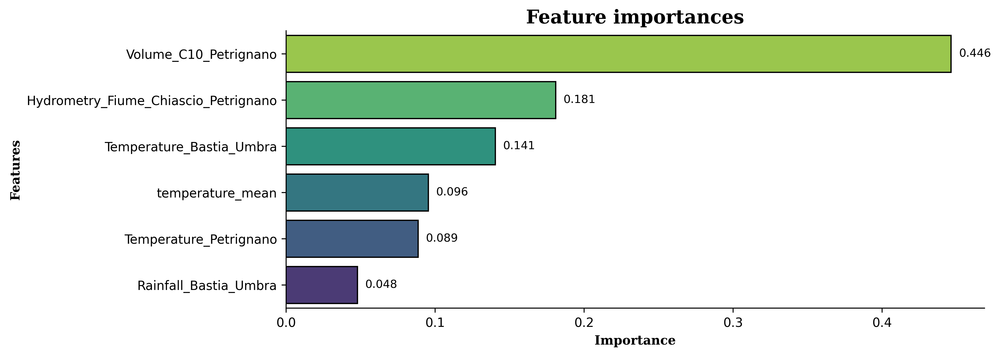

In [127]:
model_imp_viz(model, X_train, bias = 0.016)

The average monthly values of the Depth_to_Groundwater_P24 indicator:

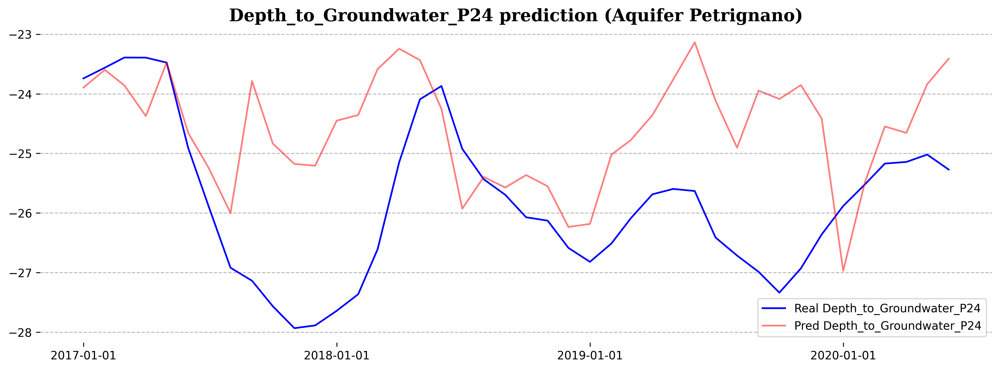

In [128]:
predicted_viz(y_test_p24, y_pred_p24, 'Depth_to_Groundwater_P24', 'Aquifer Petrignano')

The model recognizes fluctuations in the Depth_to_Groundwater feature but consistently overestimates the results. In addition, the prediction for 2020 looks extremely strange.

In [129]:
params = {'n_estimators': 200,
          'max_depth': 4,
          'subsample': 1,
          'learning_rate': 0.03,
          'random_state': 0}

model = XGBRegressor(**params)

model.fit(X_train, y_train_p25)

y_pred_p25 = model.predict(X_test)
print('MAE value (Depth_to_Groundwater_P25): %.4f'
      %mean_absolute_error(y_test_p25, y_pred_p25))

MAE value (Depth_to_Groundwater_P25): 1.7620


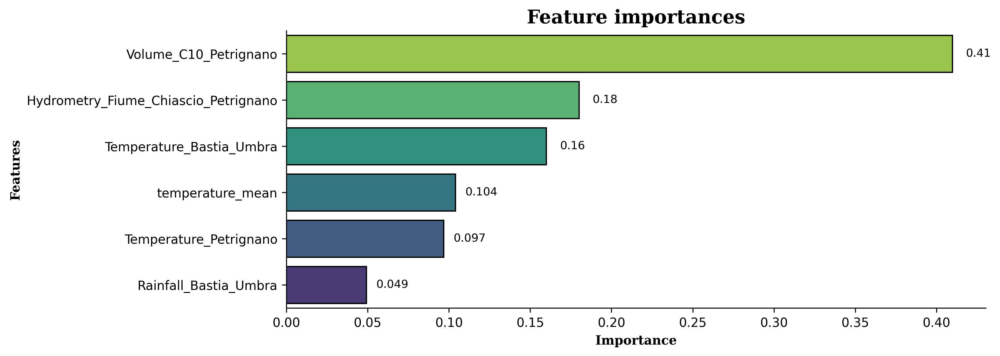

In [130]:
model_imp_viz(model, X_train, bias = 0.016)

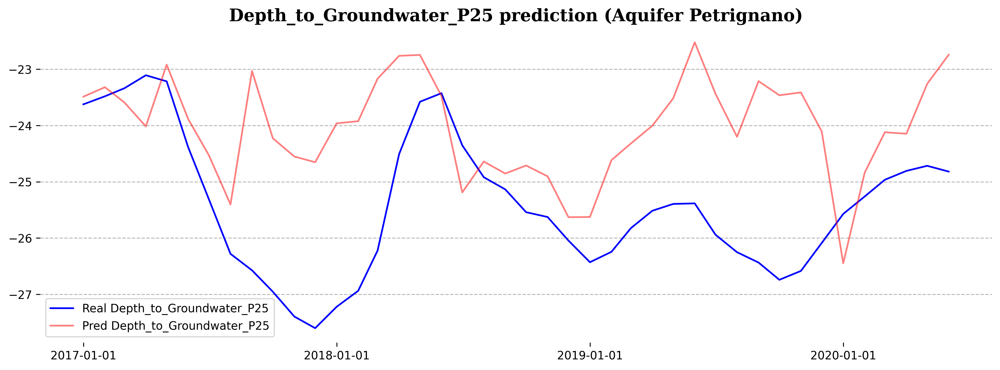

In [79]:
predicted_viz(y_test_p25, y_pred_p25, 'Depth_to_Groundwater_P25', 'Aquifer Petrignano')

The predictions for Depth_to_Groundwater_P25 are almost identical.


##Aquifer Auser

This waterbody consists of two subsystems, called NORTH and SOUTH, where the former partly influences the behavior of the latter. Indeed, the north subsystem is a water table (or unconfined) aquifer while the south subsystem is an artesian (or confined) groundwater.

The levels of the NORTH sector are represented by the values of the SAL, PAG, CoS and DIEC wells, while the levels of the SOUTH sector by the LT2 well.

In [131]:
df = Aquifer_Auser.reset_index()
df['Date'] = pd.to_datetime(df['Date'], format='%d/%m/%Y')  # Specify the correct format for your dates
df['year'] = df['Date'].dt.year
df['month'] = df['Date'].dt.month

# Monthly dynamics
df['month_year'] = df['Date'].apply(lambda x: x.strftime('%Y/%m'))

aa_means = df.groupby('month_year').mean().reset_index()
aa_means['month_year'] = pd.to_datetime(aa_means['month_year'])

rainfall_col = [col for col in aa_means.columns if 'Rainfall' in col]
temperature_col = [col for col in aa_means.columns if 'Temperature' in col]
volume_col = [col for col in aa_means.columns if 'Volume' in col]
hydrometry_col = [col for col in aa_means.columns if 'Hydrometry' in col]
groundwater_col = [col for col in aa_means.columns if 'Depth_to_Groundwater' in col]

aa_means['rainfall'] = aa_means[rainfall_col].mean(axis = 1)

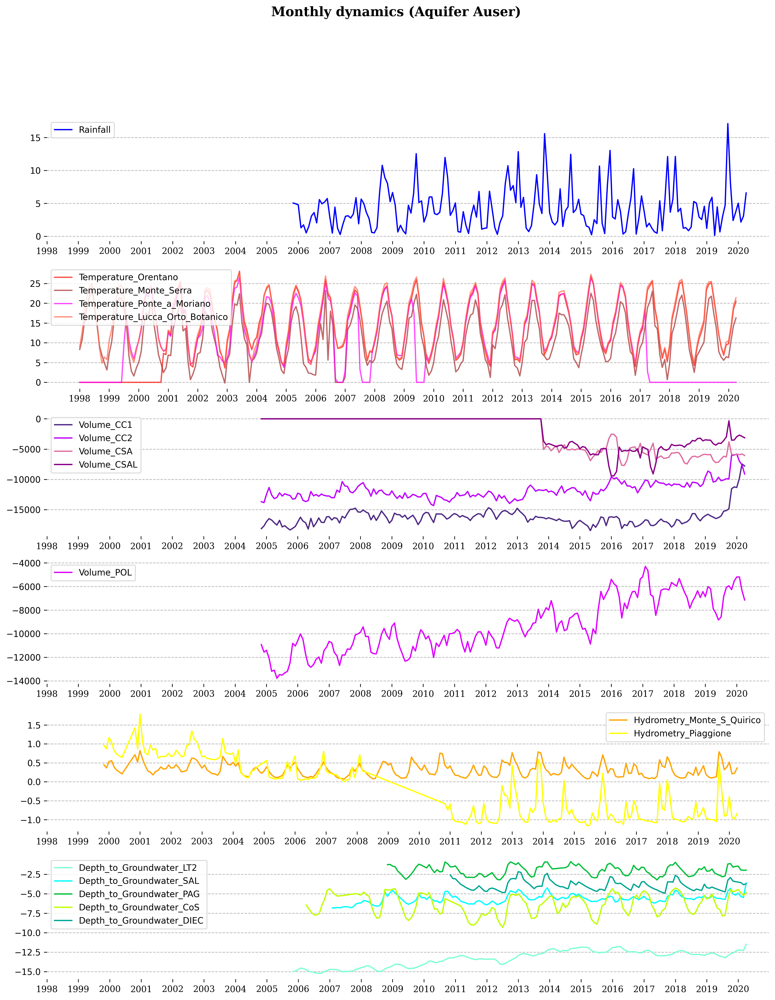

In [132]:
fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(6, 1, figsize = (15, 18))
plt.suptitle('Monthly dynamics (Aquifer Auser)', size = 15, fontweight = 'bold', fontfamily = 'serif')

sns.lineplot(data = aa_means, x = 'month_year', y = 'rainfall',
             color = 'blue', label = 'Rainfall', alpha = 1,
             ax = ax1)

for i in ['top', 'right', 'bottom', 'left']:
        ax1.spines[i].set_visible(False)

ax1.set_xticks(aa_means.month_year[::12])
ax1.set_xticklabels(range(1998, 2021, 1), fontfamily = 'serif')
ax1.set_xlabel('')
ax1.set_ylabel('')
ax1.grid(axis = 'y', linestyle = '--', alpha = 0.9)



colors = ['#FF0800', '#A52A2A', '#FF00FF', '#FF6347']
n = 0
for i in temperature_col:
    sns.lineplot(data = aa_means, x = 'month_year', y = i,
                 color = colors[n], label = i, alpha = 0.7,
                 ax = ax2)
    n +=1

for i in ['top', 'right', 'bottom', 'left']:
        ax2.spines[i].set_visible(False)

ax2.set_xticks(aa_means.month_year[::12])
ax2.set_xticklabels(range(1998, 2021, 1), fontfamily = 'serif')
ax2.set_xlabel('')
ax2.set_ylabel('')
ax2.grid(axis = 'y', linestyle = '--', alpha = 0.9)



colors = ['#4E2A84', '#BF00FF', '#DE6FA1', '#880085']
n = 0
for i in volume_col[1:]:
    sns.lineplot(data = aa_means, x = 'month_year', y = i,
                 color = colors[n], label = i, alpha = 1,
                 ax = ax3)
    n += 1

for i in ['top', 'right', 'bottom', 'left']:
        ax3.spines[i].set_visible(False)

ax3.set_xticks(aa_means.month_year[::12])
ax3.set_xticklabels(range(1998, 2021, 1), fontfamily = 'serif')
ax3.set_xlabel('')
ax3.set_ylabel('')
ax3.grid(axis = 'y', linestyle = '--', alpha = 0.9)



sns.lineplot(data = aa_means, x = 'month_year', y = volume_col[0],
             color = '#DF00FF', label = volume_col[0], alpha = 1,
             ax = ax4)

for i in ['top', 'right', 'bottom', 'left']:
        ax4.spines[i].set_visible(False)

ax4.set_xticks(aa_means.month_year[::12])
ax4.set_xticklabels(range(1998, 2021, 1), fontfamily = 'serif')
ax4.set_xlabel('')
ax4.set_ylabel('')
ax4.grid(axis = 'y', linestyle = '--', alpha = 0.9)



colors = ['orange', 'yellow']
n = 0
for i in hydrometry_col:
    sns.lineplot(data = aa_means, x = 'month_year', y = i,
                 color = colors[n], label = i, alpha = 1,
                 ax = ax5)
    n += 1

for i in ['top', 'right', 'bottom', 'left']:
        ax5.spines[i].set_visible(False)

ax5.set_xticks(aa_means.month_year[::12])
ax5.set_xticklabels(range(1998, 2021, 1), fontfamily = 'serif')
ax5.set_xlabel('')
ax5.set_ylabel('')
ax5.grid(axis = 'y', linestyle = '--', alpha = 0.9)



colors = ['#7FFFD4', '#00FFFF', '#03C03C', '#BFFF00', '#00A693']
n = 0
for i in groundwater_col:
    sns.lineplot(data = aa_means, x = 'month_year', y = i,
                 color = colors[n], label = i, alpha = 1,
                 ax = ax6)
    n += 1

for i in ['top', 'right', 'bottom', 'left']:
        ax6.spines[i].set_visible(False)

ax6.set_xticks(aa_means.month_year[::12])
ax6.set_xticklabels(range(1998, 2021, 1), fontfamily = 'serif')
ax6.set_xlabel('')
ax6.set_ylabel('')
ax6.grid(axis = 'y', linestyle = '--', alpha = 0.9)

plt.show()

The dynamic of rainfall covers the period from 2006 to 2020.

The temperature dynamics have no obvious missing values.

Volume_POL, Volume_CSA, and Volume_CSAL have very sharp jumps in values after certain time points.

Hydrometry and depth to groundwater indicators are stable and consistent with seasonal patterns.

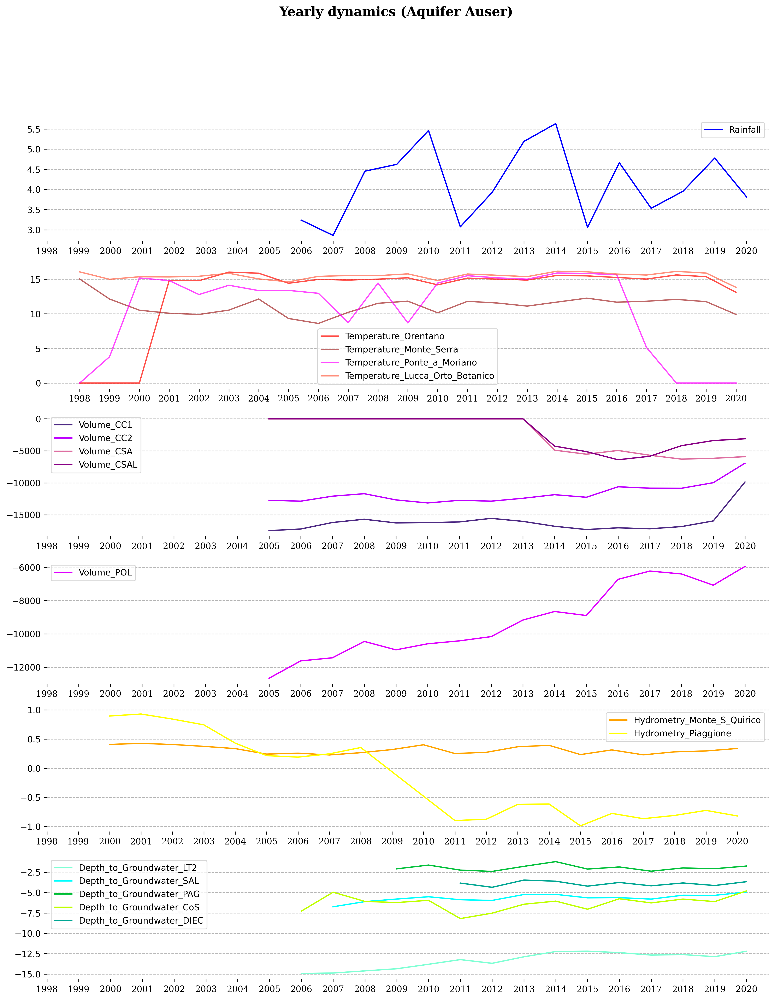

In [135]:
# Yearly dynamics
aa_means_y = df.drop(columns=['month_year']).groupby('year').mean().reset_index()  # Exclude 'month_year' from the grouping
aa_means_y['rainfall'] = aa_means_y[rainfall_col].mean(axis=1)

fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(6, 1, figsize = (15, 18))
plt.suptitle('Yearly dynamics (Aquifer Auser)', size = 15, fontweight = 'bold', fontfamily = 'serif')

sns.lineplot(data = aa_means_y, x = 'year', y = 'rainfall',
             color = 'blue', label = 'Rainfall', alpha = 1,
             ax = ax1)

for i in ['top', 'right', 'bottom', 'left']:
        ax1.spines[i].set_visible(False)

ax1.set_xticks(aa_means_y.year[::1])
ax1.set_xticklabels(range(1998, 2021, 1), fontfamily = 'serif')
ax1.set_xlabel('')
ax1.set_ylabel('')
ax1.grid(axis = 'y', linestyle = '--', alpha = 0.9)



colors = ['#FF0800', '#A52A2A', '#FF00FF', '#FF6347']
n = 0
for i in temperature_col:
    sns.lineplot(data = aa_means_y, x = 'year', y = i,
                 color = colors[n], label = i, alpha = 0.7,
                 ax = ax2)
    n +=1

for i in ['top', 'right', 'bottom', 'left']:
        ax2.spines[i].set_visible(False)

ax2.set_xticks(aa_means_y.year[::1])
ax2.set_xticklabels(range(1998, 2021, 1), fontfamily = 'serif')
ax2.set_xlabel('')
ax2.set_ylabel('')
ax2.grid(axis = 'y', linestyle = '--', alpha = 0.9)



colors = ['#4E2A84', '#BF00FF', '#DE6FA1', '#880085']
n = 0
for i in volume_col[1:]:
    sns.lineplot(data = aa_means_y, x = 'year', y = i,
                 color = colors[n], label = i, alpha = 1,
                 ax = ax3)
    n += 1

for i in ['top', 'right', 'bottom', 'left']:
        ax3.spines[i].set_visible(False)

ax3.set_xticks(aa_means_y.year[::1])
ax3.set_xticklabels(range(1998, 2021, 1), fontfamily = 'serif')
ax3.set_xlabel('')
ax3.set_ylabel('')
ax3.grid(axis = 'y', linestyle = '--', alpha = 0.9)



sns.lineplot(data = aa_means_y, x = 'year', y = volume_col[0],
             color = '#DF00FF', label = volume_col[0], alpha = 1,
             ax = ax4)

for i in ['top', 'right', 'bottom', 'left']:
        ax4.spines[i].set_visible(False)

ax4.set_xticks(aa_means_y.year[::1])
ax4.set_xticklabels(range(1998, 2021, 1), fontfamily = 'serif')
ax4.set_xlabel('')
ax4.set_ylabel('')
ax4.grid(axis = 'y', linestyle = '--', alpha = 0.9)



colors = ['orange', 'yellow']
n = 0
for i in hydrometry_col:
    sns.lineplot(data = aa_means_y, x = 'year', y = i,
                 color = colors[n], label = i, alpha = 1,
                 ax = ax5)
    n += 1

for i in ['top', 'right', 'bottom', 'left']:
        ax5.spines[i].set_visible(False)

ax5.set_xticks(aa_means_y.year[::1])
ax5.set_xticklabels(range(1998, 2021, 1), fontfamily = 'serif')
ax5.set_xlabel('')
ax5.set_ylabel('')
ax5.grid(axis = 'y', linestyle = '--', alpha = 0.9)



colors = ['#7FFFD4', '#00FFFF', '#03C03C', '#BFFF00', '#00A693']
n = 0
for i in groundwater_col:
    sns.lineplot(data = aa_means_y, x = 'year', y = i,
                 color = colors[n], label = i, alpha = 1,
                 ax = ax6)
    n += 1

for i in ['top', 'right', 'bottom', 'left']:
        ax6.spines[i].set_visible(False)

ax6.set_xticks(aa_means_y.year[::1])
ax6.set_xticklabels(range(1998, 2021, 1), fontfamily = 'serif')
ax6.set_xlabel('')
ax6.set_ylabel('')
ax6.grid(axis = 'y', linestyle = '--', alpha = 0.9)

plt.show()

##Aquifer Auser
Base on the previous feature overview, we'll use for prediction the data from 2007 to 2020 (because there is no data for most features for the 1998-2006 time period). We'll also create 'rainfal_mean', 'temperature_mean', 'volume_mean' and 'hydrometry_mean' features. Some columns with missing values will be dropped. Missing values will be fill by 'bfill' method.

In [136]:
AA_pred = Aquifer_Auser.iloc[3224:, :]
rainfall_col = [col for col in AA_pred.columns if 'Rainfall' in col]
temperature_col = [col for col in AA_pred.columns if 'Temperature' in col]
volume_col = [col for col in AA_pred.columns if 'Volume' in col]
hydrometry_col = [col for col in AA_pred.columns if 'Hydrometry' in col]

AA_pred['rainfall_mean'] = AA_pred[rainfall_col].mean(axis = 1).values
AA_pred['temperature_mean'] = AA_pred[temperature_col].mean(axis = 1).values
AA_pred['volume_mean'] = AA_pred[volume_col].mean(axis = 1).values
AA_pred['hydrometry_mean'] = AA_pred[hydrometry_col].mean(axis = 1).values
AA_pred = AA_pred.drop(['Depth_to_Groundwater_PAG', 'Depth_to_Groundwater_DIEC',
                        'Temperature_Ponte_a_Moriano', 'Temperature_Orentano',
                        'Volume_CSA', 'Volume_CSAL'], axis = 1)
AA_pred = AA_pred.fillna(method = 'bfill')

AA_pred

,Rainfall_Gallicano,Rainfall_Pontetetto,Rainfall_Monte_Serra,Rainfall_Orentano,Rainfall_Borgo_a_Mozzano,Rainfall_Piaggione,Rainfall_Calavorno,Rainfall_Croce_Arcana,Rainfall_Tereglio_Coreglia_Antelminelli,Rainfall_Fabbriche_di_Vallico,...,Temperature_Lucca_Orto_Botanico,Volume_POL,Volume_CC1,Volume_CC2,Hydrometry_Monte_S_Quirico,Hydrometry_Piaggione,rainfall_mean,temperature_mean,volume_mean,hydrometry_mean
Date,,,,,,,,,,,,,,,,,,,,,
01/01/2007,4.0,8.4,25.6,9.6,6.0,10.6,4.2,1.8,21.6,5.2,...,13.15,-11492.677420,-17254.080,-12727.878710,0.24,0.65,9.70,6.7500,-8294.927226,0.240
02/01/2007,28.6,12.0,0.2,6.6,32.8,39.4,34.4,8.8,9.0,38.8,...,9.70,-11492.677420,-17254.080,-12727.878710,0.48,0.65,21.06,5.6375,-8294.927226,0.480
03/01/2007,0.0,0.0,0.0,0.0,0.2,0.0,0.2,0.2,0.0,0.0,...,6.00,-11492.677420,-17254.080,-12727.878710,0.40,0.65,0.06,3.1000,-8294.927226,0.400
04/01/2007,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.8,0.0,...,3.10,-11492.677420,-17254.080,-12727.878710,0.36,0.65,0.78,2.2250,-8294.927226,0.360
05/01/2007,7.6,0.0,0.0,0.0,5.4,2.2,5.8,0.0,0.0,7.0,...,8.05,-11492.677420,-17254.080,-12727.878710,0.33,0.65,2.80,2.9750,-8294.927226,0.330
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26/06/2020,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,23.75,-7189.406533,-7847.900,-9183.433333,0.20,-1.03,0.00,16.9250,-6698.827973,-0.415
27/06/2020,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,24.30,-7189.406533,-7847.900,-9183.433333,0.21,-1.03,0.00,17.3125,-6698.827973,-0.410
28/06/2020,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,24.55,-6829.936207,-7455.505,-8724.261667,0.23,-1.03,0.00,17.5750,-6363.886575,-0.400


Then we'll split our data on a train (70%) and a test (30%) datasets without shuffling(!). Thus, we'll train the model on data obtained before 2017 and check it on data for 2017-2020.

We chose XGB as the most popular, and one of the most powerful algorithms. It also does not require data normalization. Parameters for the model were chosen after some experiments.

In [145]:
y = AA_pred[['Depth_to_Groundwater_LT2', 'Depth_to_Groundwater_SAL',
             'Depth_to_Groundwater_CoS']]
X = AA_pred.drop(['Depth_to_Groundwater_LT2', 'Depth_to_Groundwater_SAL',
                  'Depth_to_Groundwater_CoS'], axis = 1)


X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.741, shuffle = False)

In [146]:
params_0 = {'n_estimators': 200,
            'max_depth': 6,
            'subsample': 1,
            'learning_rate': 0.03,
            'random_state': 0}
params_1 = {'n_estimators': 150,
            'max_depth': 6,
            'subsample': 1,
            'learning_rate': 0.03,
            'random_state': 0}
params_2 = {'n_estimators': 150,
            'max_depth': 6,
            'subsample': 1,
            'learning_rate': 0.03,
            'random_state': 0}

model_LT2 = XGBRegressor(**params_0)
model_SAL = XGBRegressor(**params_1)
model_CoS = XGBRegressor(**params_2)

model_LT2.fit(X_train, y_train.iloc[:, 0])
model_SAL.fit(X_train, y_train.iloc[:, 1])
model_CoS.fit(X_train, y_train.iloc[:, 2])

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.03, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=6, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=150, n_jobs=None,
             num_parallel_tree=None, random_state=0, ...)

In [147]:
y_pred_LT2 = model_LT2.predict(X_test)
y_pred_SAL = model_SAL.predict(X_test)
y_pred_CoS = model_CoS.predict(X_test)

print('MAE value (Depth_to_Groundwater_LT2): %.4f'
      %mean_absolute_error(y_test.iloc[:, 0], y_pred_LT2))
print('MAE value (Depth_to_Groundwater_SAL): %.4f'
      %mean_absolute_error(y_test.iloc[:, 1], y_pred_SAL))
print('MAE value (Depth_to_Groundwater_CoS): %.4f'
      %mean_absolute_error(y_test.iloc[:, 2], y_pred_CoS))

MAE value (Depth_to_Groundwater_LT2): 0.4126
MAE value (Depth_to_Groundwater_SAL): 0.3627
MAE value (Depth_to_Groundwater_CoS): 0.5118


The mean absolute error of the predicted values for the 3 features varies from 0.31 to 0.44, which means that, on average, our models make a mistake by 0.3-0.4 meters.

Depth_to_Groundwater_LT2


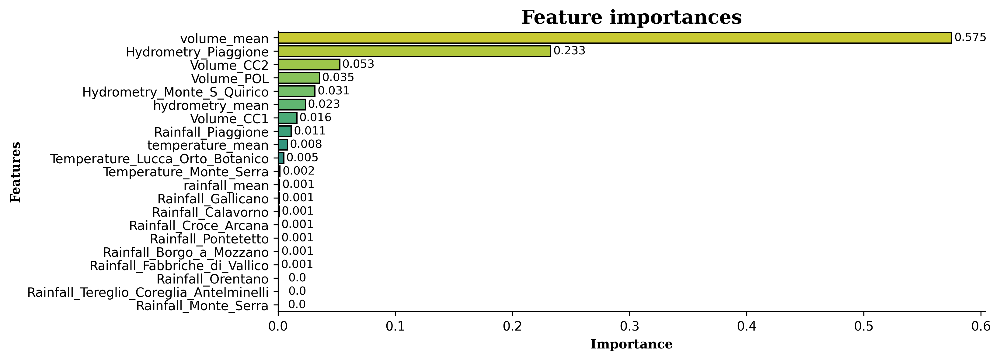

Depth_to_Groundwater_SAL


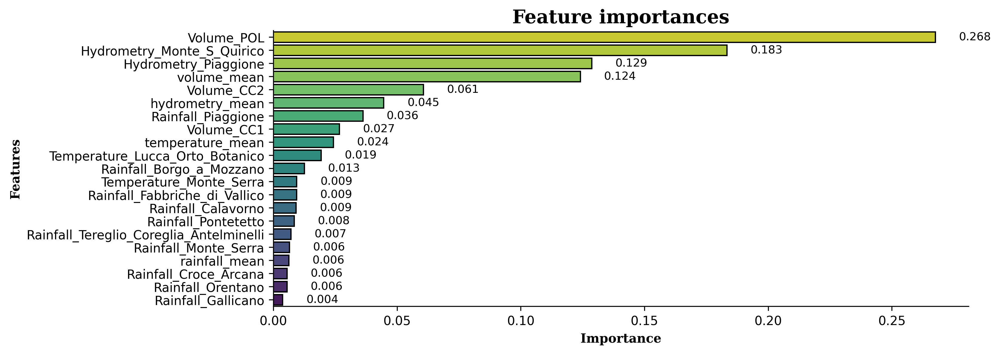

Depth_to_Groundwater_CoS


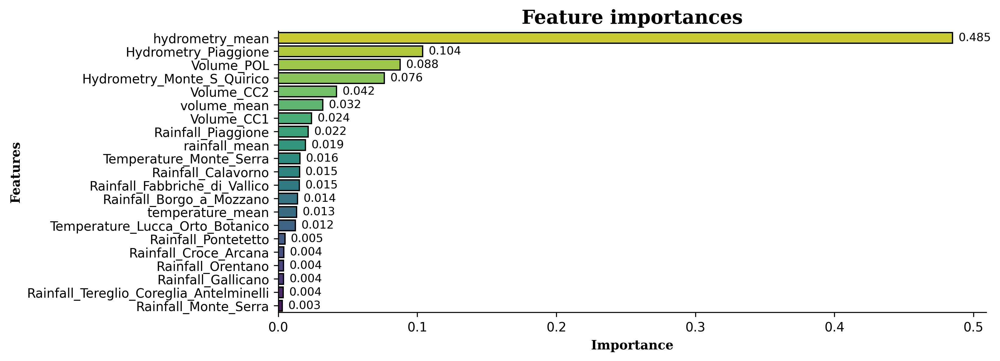

In [148]:
print('Depth_to_Groundwater_LT2')
model_imp_viz(model_LT2, X_train, bias = 0.016)

print('Depth_to_Groundwater_SAL')
model_imp_viz(model_SAL, X_train, bias = 0.016)

print('Depth_to_Groundwater_CoS')
model_imp_viz(model_CoS, X_train, bias = 0.016)

The average monthly values of the Depth_to_Groundwater indicators predictions.

In [149]:
predicted_viz(y_test.iloc[:, 0], y_pred_LT2, 'Depth_to_Groundwater_LT2', 'Aquifer Auser')
predicted_viz(y_test.iloc[:, 1], y_pred_SAL, 'Depth_to_Groundwater_SAL', 'Aquifer Auser')
predicted_viz(y_test.iloc[:, 2], y_pred_CoS, 'Depth_to_Groundwater_CoS', 'Aquifer Auser')

ValueError: time data "13/01/2017" doesn't match format "%m/%d/%Y", at position 12. You might want to try:
    - passing `format` if your strings have a consistent format;
    - passing `format='ISO8601'` if your strings are all ISO8601 but not necessarily in exactly the same format;
    - passing `format='mixed'`, and the format will be inferred for each element individually. You might want to use `dayfirst` alongside this.

##Aquifer Doganella (features)

The wells field Doganella is fed by two underground aquifers not fed by rivers or lakes but fed by meteoric infiltration. The upper aquifer is a water table with a thickness of about 30m. The lower aquifer is a semi-confined artesian aquifer with a thickness of 50m and is located inside lavas and tufa products. These aquifers are accessed through wells called Well 1, ..., Well 9. Approximately 80% of the drainage volumes come from the artesian aquifer. The aquifer levels are influenced by the following parameters: rainfall, humidity, subsoil, temperatures and drainage volumes.

In [153]:
import pandas as pd

df = Aquifer_Doganella.reset_index()
# Convert 'Date' column to datetime, handling errors
df['Date'] = pd.to_datetime(df['Date'], format='%d/%m/%Y', errors='coerce')
# errors='coerce' will set invalid parsing to NaT

# Filter out rows with NaT in 'Date' column
df = df.dropna(subset=['Date'])

# Extract year and month
df['year'] = df['Date'].dt.year
df['month'] = df['Date'].dt.month

# Create 'month_year' column
df['month_year'] = df['Date'].apply(lambda x: x.strftime('%Y/%m'))

# Calculate monthly means
ad_means = df.groupby('month_year').mean().reset_index()
ad_means['month_year'] = pd.to_datetime(ad_means['month_year'])

rainfall_col = [col for col in ad_means.columns if 'Rainfall' in col]
temperature_col = [col for col in ad_means.columns if 'Temperature' in col]
volume_col = [col for col in ad_means.columns if 'Volume' in col]
groundwater_col = [col for col in ad_means.columns if 'Depth_to_Groundwater' in col]

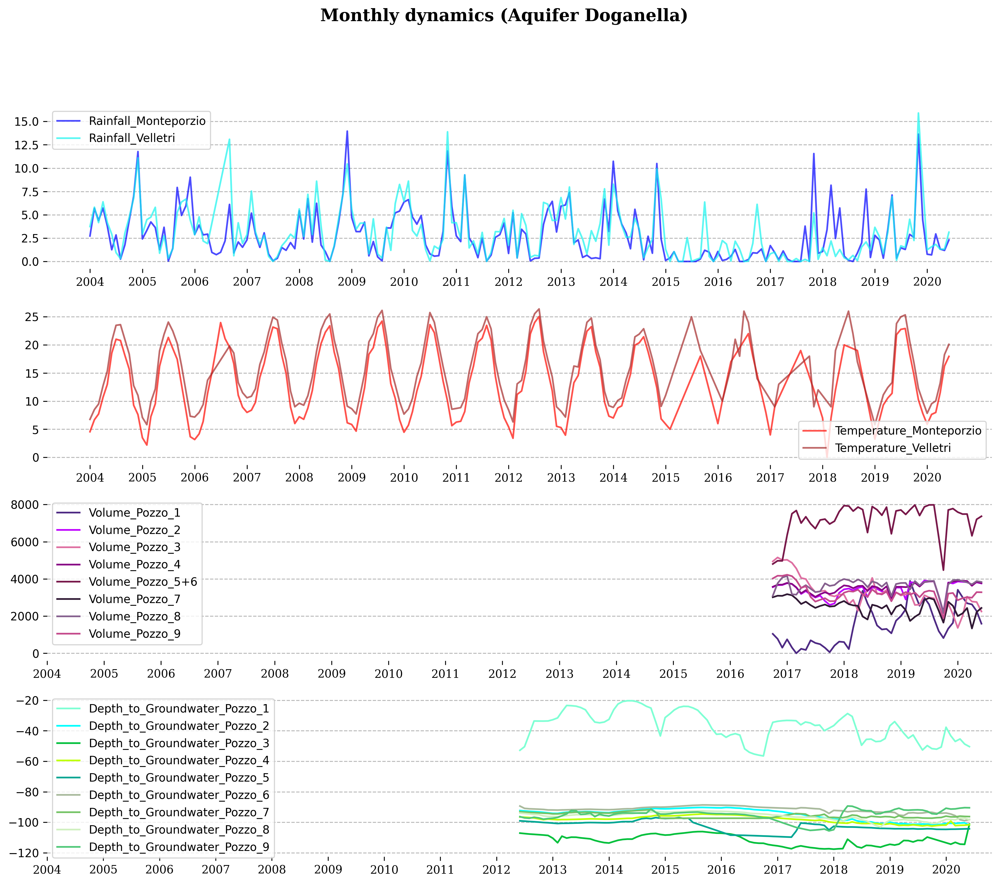

In [154]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize = (15, 12))
plt.suptitle('Monthly dynamics (Aquifer Doganella)', size = 15, fontweight = 'bold', fontfamily = 'serif')

colors = ['blue', '#15F4EE']
n = 0
for i in rainfall_col:
    sns.lineplot(data = ad_means, x = 'month_year', y = i,
                 color = colors[n], label = i, alpha = 0.7,
                 ax = ax1)
    n += 1

for i in ['top', 'right', 'bottom', 'left']:
        ax1.spines[i].set_visible(False)

ax1.set_xticks(ad_means.month_year[::12])
ax1.set_xticklabels(range(2004, 2021, 1), fontfamily = 'serif')
ax1.set_xlabel('')
ax1.set_ylabel('')
ax1.grid(axis = 'y', linestyle = '--', alpha = 0.9)



colors = ['#FF0800', '#A52A2A']
n = 0
for i in temperature_col:
    sns.lineplot(data = ad_means, x = 'month_year', y = i,
                 color = colors[n], label = i, alpha = 0.7,
                 ax = ax2)
    n +=1

for i in ['top', 'right', 'bottom', 'left']:
        ax2.spines[i].set_visible(False)

ax2.set_xticks(ad_means.month_year[::12])
ax2.set_xticklabels(range(2004, 2021, 1), fontfamily = 'serif')
ax2.set_xlabel('')
ax2.set_ylabel('')
ax2.grid(axis = 'y', linestyle = '--', alpha = 0.9)



colors = ['#4E2A84', '#BF00FF', '#DE6FA1', '#880085', '#78184A',
          '#301934', '#86608E', '#C54B8C']
n = 0
for i in volume_col:
    sns.lineplot(data = ad_means, x = 'month_year', y = i,
                 color = colors[n], label = i, alpha = 1,
                 ax = ax3)
    n += 1

for i in ['top', 'right', 'bottom', 'left']:
        ax3.spines[i].set_visible(False)

ax3.set_xticks(ad_means.month_year[::12])
ax3.set_xticklabels(range(2004, 2021, 1), fontfamily = 'serif')
ax3.set_xlabel('')
ax3.set_ylabel('')
ax3.grid(axis = 'y', linestyle = '--', alpha = 0.9)



colors = ['#7FFFD4', '#00FFFF', '#03C03C', '#BFFF00', '#00A693',
          '#A9BA9D', '#74C365', '#D0F0C0', '#50C878']
n = 0
for i in groundwater_col:
    sns.lineplot(data = ad_means, x = 'month_year', y = i,
                 color = colors[n], label = i, alpha = 1,
                 ax = ax4)
    n += 1

for i in ['top', 'right', 'bottom', 'left']:
        ax4.spines[i].set_visible(False)

ax4.set_xticks(ad_means.month_year[::12])
ax4.set_xticklabels(range(2004, 2021, 1), fontfamily = 'serif')
ax4.set_xlabel('')
ax4.set_ylabel('')
ax4.grid(axis = 'y', linestyle = '--', alpha = 0.9)

plt.show()

In general, rainfall indicators are highly correlated with each other, as well as temperature indicators. The period from 2015 to 2019 has many missing values in temperature indicators. Because a significant part of the depth to groundwater and volume indicators falls on this period, in the future we may have to first predict the temperature values.

Also, from 2015 to 2018, a decrease in precipitation was observed, which to a small extent could affect the depth to groundwater.

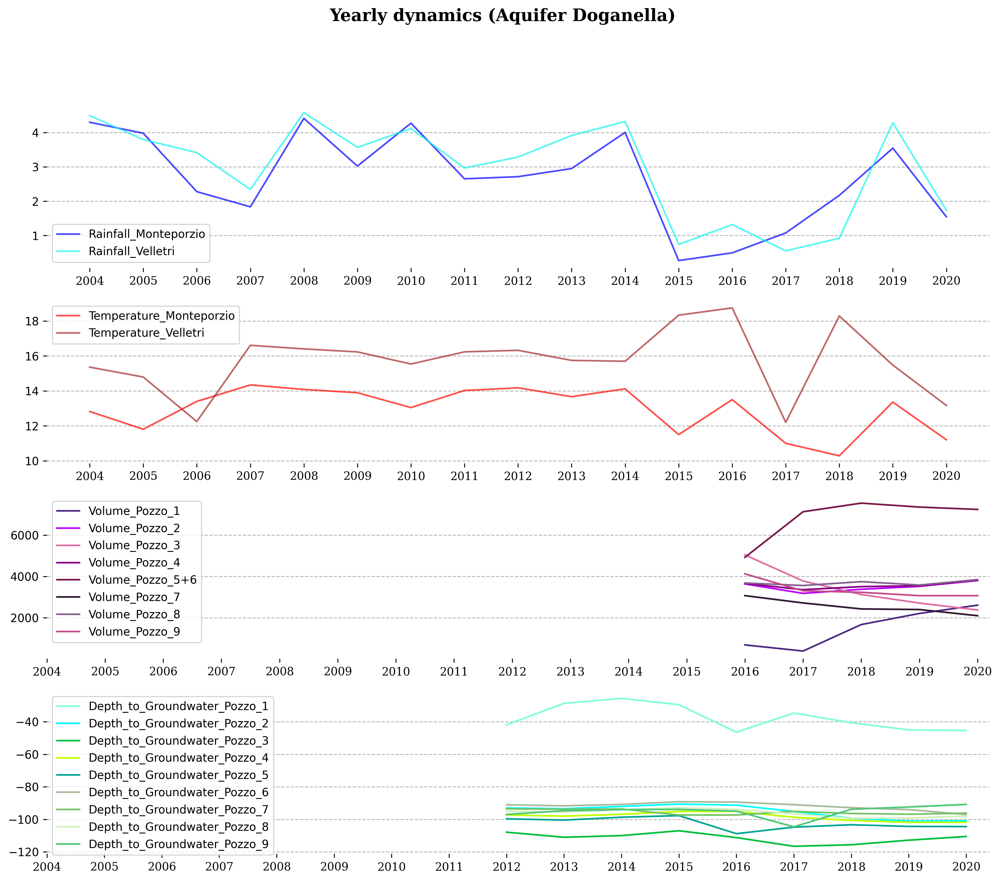

In [156]:
# Yearly dynamics
ad_means_y = df.drop(columns=['month_year']).groupby('year').mean().reset_index()
# Drop the 'month_year' column before calculating the mean

fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize = (15, 12))
plt.suptitle('Yearly dynamics (Aquifer Doganella)', size = 15, fontweight = 'bold', fontfamily = 'serif')

colors = ['blue', '#15F4EE']
n = 0
for i in rainfall_col:
    sns.lineplot(data = ad_means_y, x = 'year', y = i,
                 color = colors[n], label = i, alpha = 0.7,
                 ax = ax1)
    n += 1

for i in ['top', 'right', 'bottom', 'left']:
        ax1.spines[i].set_visible(False)

ax1.set_xticks(ad_means_y.year[::1])
ax1.set_xticklabels(range(2004, 2021, 1), fontfamily = 'serif')
ax1.set_xlabel('')
ax1.set_ylabel('')
ax1.grid(axis = 'y', linestyle = '--', alpha = 0.9)



colors = ['#FF0800', '#A52A2A']
n = 0
for i in temperature_col:
    sns.lineplot(data = ad_means_y, x = 'year', y = i,
                 color = colors[n], label = i, alpha = 0.7,
                 ax = ax2)
    n +=1

for i in ['top', 'right', 'bottom', 'left']:
        ax2.spines[i].set_visible(False)

ax2.set_xticks(ad_means_y.year[::1])
ax2.set_xticklabels(range(2004, 2021, 1), fontfamily = 'serif')
ax2.set_xlabel('')
ax2.set_ylabel('')
ax2.grid(axis = 'y', linestyle = '--', alpha = 0.9)



colors = ['#4E2A84', '#BF00FF', '#DE6FA1', '#880085', '#78184A',
          '#301934', '#86608E', '#C54B8C']
n = 0
for i in volume_col:
    sns.lineplot(data = ad_means_y, x = 'year', y = i,
                 color = colors[n], label = i, alpha = 1,
                 ax = ax3)
    n += 1

for i in ['top', 'right', 'bottom', 'left']:
        ax3.spines[i].set_visible(False)

ax3.set_xticks(ad_means_y.year[::1])
ax3.set_xticklabels(range(2004, 2021, 1), fontfamily = 'serif')
ax3.set_xlabel('')
ax3.set_ylabel('')
ax3.grid(axis = 'y', linestyle = '--', alpha = 0.9)



colors = ['#7FFFD4', '#00FFFF', '#03C03C', '#BFFF00', '#00A693',
          '#A9BA9D', '#74C365', '#D0F0C0', '#50C878']
n = 0
for i in groundwater_col:
    sns.lineplot(data = ad_means_y, x = 'year', y = i,
                 color = colors[n], label = i, alpha = 1,
                 ax = ax4)
    n += 1

for i in ['top', 'right', 'bottom', 'left']:
        ax4.spines[i].set_visible(False)

ax4.set_xticks(ad_means_y.year[::1])
ax4.set_xticklabels(range(2004, 2021, 1), fontfamily = 'serif')
ax4.set_xlabel('')
ax4.set_ylabel('')
ax4.grid(axis = 'y', linestyle = '--', alpha = 0.9)

plt.show()

Also, as with Aquifer Auser, many indicators of Volume (but not temperature) significantly correlate with indicators of depth to groundwater.

##Aquifer Doganella (prediction)

For this water body, the situation with predictors does not look entirely unambiguous. The most important indicator for aquifers - volume - is presented only for the period 2016-2020. Another indicator - temperature - for this period has a large number of missing values. Taking these features of the data into account, we will take the last five-year period for training and testing the model and exclude temperature from the number of predictors (if we look at the importance of predictors for past aquifers, temperature plays a rather insignificant role). We'll also create 'rainfal_mean', and 'volume_mean' features. Some columns with missing values will be dropped. Missing values will be fill by 'interpolate' and 'bfill' methods.

In [161]:
AD_pred = Aquifer_Doganella[pd.to_datetime(Aquifer_Doganella.index, dayfirst=True).year >= 2016]
# Convert the index to DatetimeIndex using pd.to_datetime() before accessing .year
# Assuming the date format in the index is 'DD/MM/YYYY', set dayfirst=True
# This tells pd.to_datetime to interpret the first part of the date as the day

rainfall_col = [col for col in AD_pred.columns if 'Rainfall' in col]
volume_col = [col for col in AD_pred.columns if 'Volume' in col]

AD_pred['rainfall_mean'] = AD_pred[rainfall_col].mean(axis = 1).values
AD_pred['volume_mean'] = AD_pred[volume_col].mean(axis = 1).values
AD_pred = AD_pred.drop(['Temperature_Monteporzio', 'Temperature_Velletri'], axis = 1)
AD_pred = AD_pred.fillna(AD_pred.interpolate())
AD_pred = AD_pred.fillna(method = 'bfill')

AD_pred

,Rainfall_Monteporzio,Rainfall_Velletri,Depth_to_Groundwater_Pozzo_1,Depth_to_Groundwater_Pozzo_2,Depth_to_Groundwater_Pozzo_3,Depth_to_Groundwater_Pozzo_4,Depth_to_Groundwater_Pozzo_5,Depth_to_Groundwater_Pozzo_6,Depth_to_Groundwater_Pozzo_7,Depth_to_Groundwater_Pozzo_8,...,Volume_Pozzo_1,Volume_Pozzo_2,Volume_Pozzo_3,Volume_Pozzo_4,Volume_Pozzo_5+6,Volume_Pozzo_7,Volume_Pozzo_8,Volume_Pozzo_9,rainfall_mean,volume_mean
Date,,,,,,,,,,,,,,,,,,,,,
01/01/2016,8.0,0.0,-31.68,-90.53,-107.120,-94.95,-108.45,-88.79,-97.36,-92.79,...,585.650,1576.300,2232.760,1595.340,1882.690,1340.570,1752.550,1790.460,0.000000,1594.5400
02/01/2016,8.0,1.6,-32.73,-90.52,-107.090,-94.93,-108.45,-88.77,-97.36,-92.77,...,585.650,1576.300,2232.760,1595.340,1882.690,1340.570,1752.550,1790.460,2.666667,1594.5400
03/01/2016,8.0,3.2,-33.78,-90.51,-107.060,-94.90,-108.45,-88.75,-97.36,-92.76,...,585.650,1576.300,2232.760,1595.340,1882.690,1340.570,1752.550,1790.460,5.333333,1594.5400
04/01/2016,8.0,4.8,-33.78,-90.49,-106.910,-94.82,-108.45,-88.73,-97.36,-92.76,...,585.650,1576.300,2232.760,1595.340,1882.690,1340.570,1752.550,1790.460,8.000000,1594.5400
05/01/2016,7.5,6.4,-41.15,-90.49,-106.910,-94.82,-108.45,-88.73,-97.36,-92.73,...,585.650,1576.300,2232.760,1595.340,1882.690,1340.570,1752.550,1790.460,7.750000,1594.5400
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26/06/2020,0.0,0.0,-50.32,-100.35,-100.880,-101.49,-104.31,-97.94,-96.59,-97.74,...,1516.104,3883.932,2526.516,3867.876,7949.304,2684.412,3911.832,3450.132,0.000000,3723.7635
27/06/2020,0.0,0.0,-50.32,-100.56,-100.840,-101.59,-104.30,-97.96,-96.44,-97.78,...,1491.408,3884.724,2871.864,3867.300,7590.564,2681.280,3899.772,3449.088,0.000000,3717.0000
28/06/2020,0.0,0.0,-50.32,-100.56,-100.920,-101.59,-104.30,-98.46,-96.44,-97.78,...,1485.756,3885.228,2858.400,3869.352,7944.660,2962.980,3901.032,3449.808,0.000000,3794.6520


Then we'll split our data on a train (67%) and a test (33%) datasets.



In [162]:
depth = [col for col in AD_pred.columns if 'Depth_to_Groundwater' in col]
y = AD_pred[depth]
X = AD_pred.drop(depth, axis = 1)

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.67, shuffle = False)

In [163]:
params = {'n_estimators': 200,
          'max_depth': 2,
          'subsample': 1,
          'learning_rate': 0.04,
          'random_state': 0}

model = [XGBRegressor(**params)] * 9
for i in range(9):
    model[i] = model[i].fit(X_train, y_train.iloc[:, i])

In [164]:
y_pred = [0] * 9

for i in range(9):
    y_pred[i] = model[i].predict(X_test)
    print('MAE value (Depth_to_Groundwater_Pozzo_{}): {}'
          .format(i + 1, round(mean_absolute_error(y_test.iloc[:, i], y_pred[i]), 4)))

MAE value (Depth_to_Groundwater_Pozzo_1): 48.8071
MAE value (Depth_to_Groundwater_Pozzo_2): 6.9528
MAE value (Depth_to_Groundwater_Pozzo_3): 17.6324
MAE value (Depth_to_Groundwater_Pozzo_4): 7.7282
MAE value (Depth_to_Groundwater_Pozzo_5): 10.256
MAE value (Depth_to_Groundwater_Pozzo_6): 3.5352
MAE value (Depth_to_Groundwater_Pozzo_7): 3.3483
MAE value (Depth_to_Groundwater_Pozzo_8): 4.7937
MAE value (Depth_to_Groundwater_Pozzo_9): 2.5506


All predicted indicators are in different ranges, so it is better to assess the quality of forecasts visually.

Depth_to_Groundwater_Pozzo_1


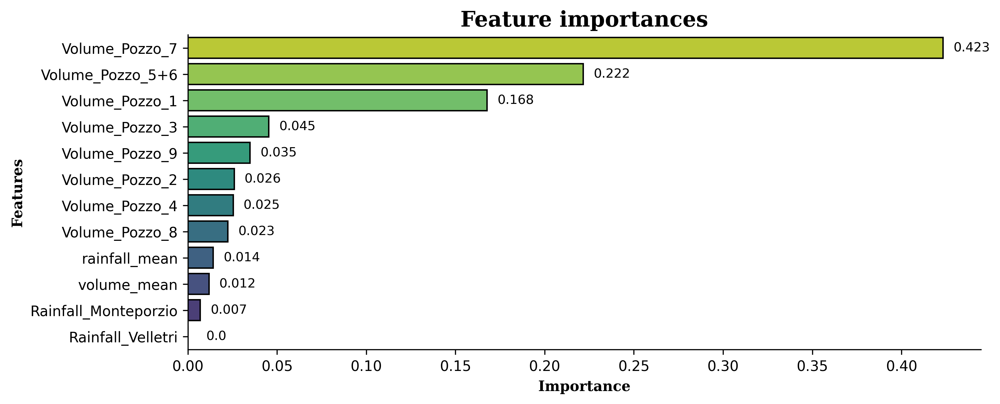

Depth_to_Groundwater_Pozzo_2


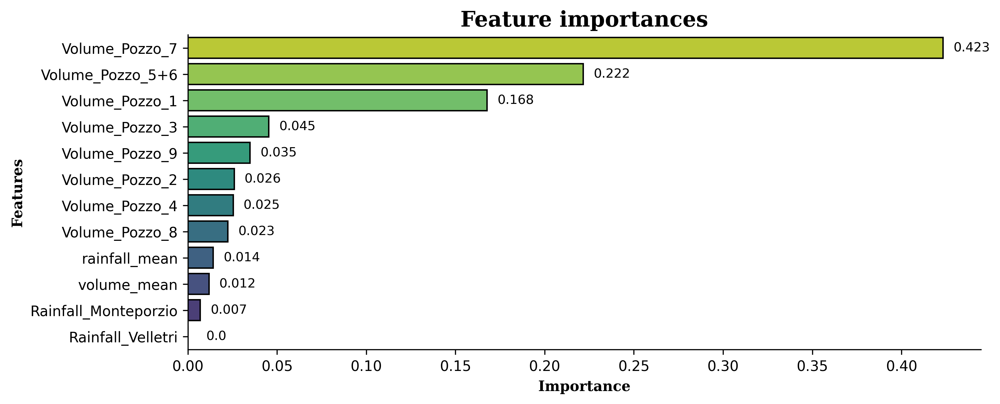

Depth_to_Groundwater_Pozzo_3


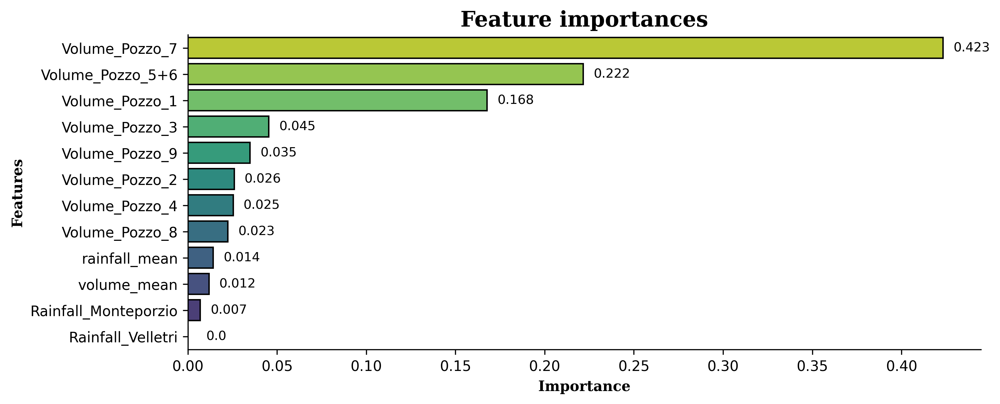

Depth_to_Groundwater_Pozzo_4


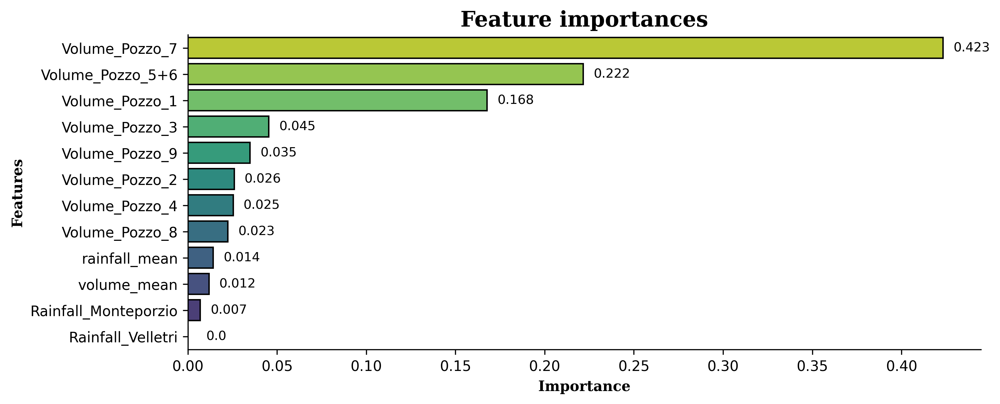

Depth_to_Groundwater_Pozzo_5


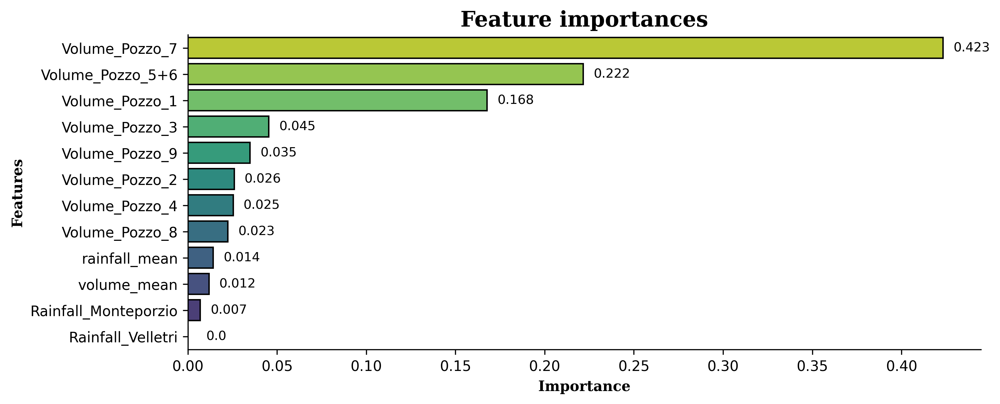

Depth_to_Groundwater_Pozzo_6


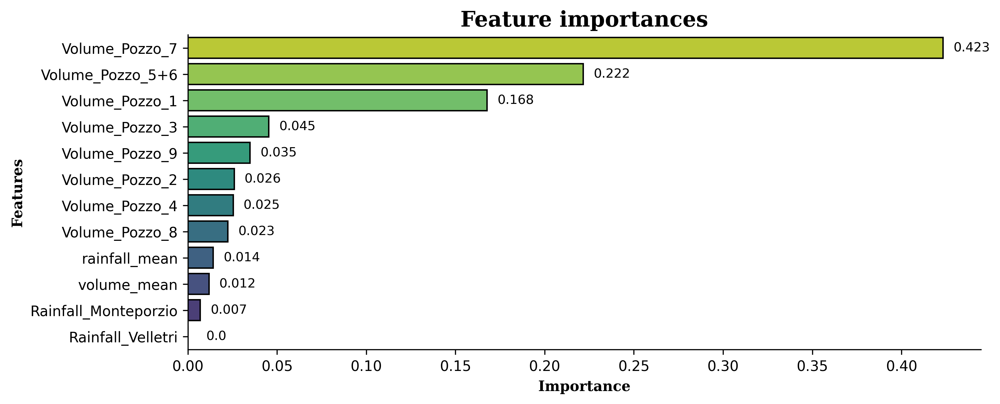

Depth_to_Groundwater_Pozzo_7


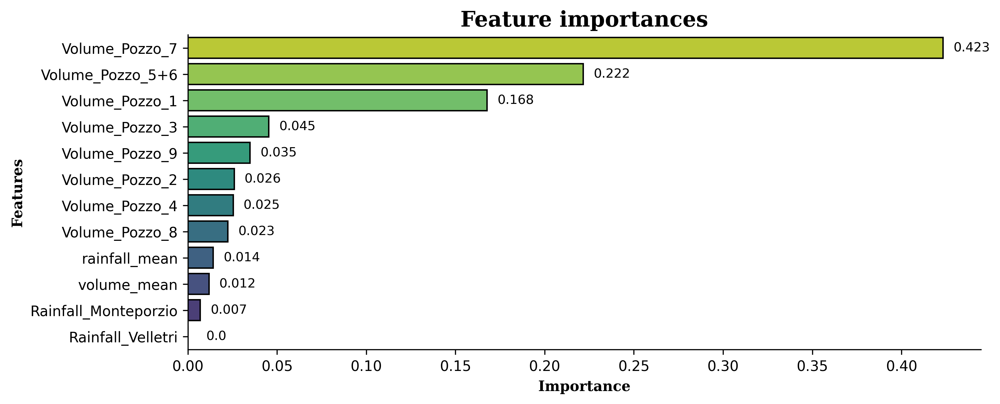

Depth_to_Groundwater_Pozzo_8


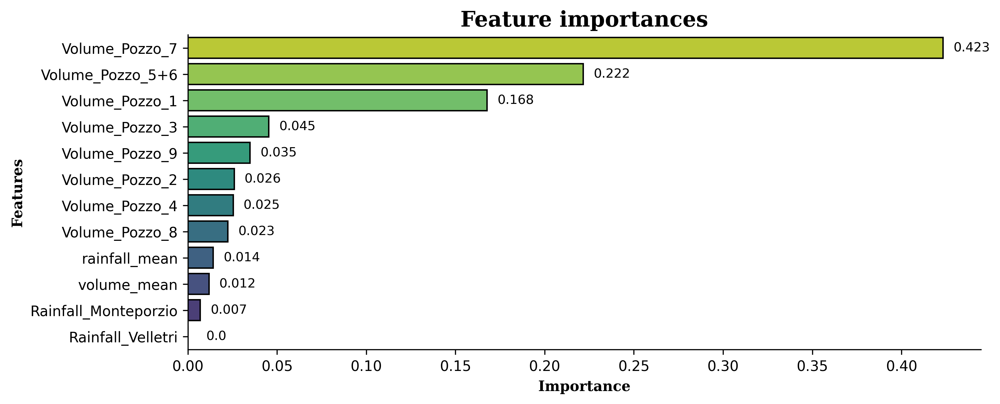

Depth_to_Groundwater_Pozzo_9


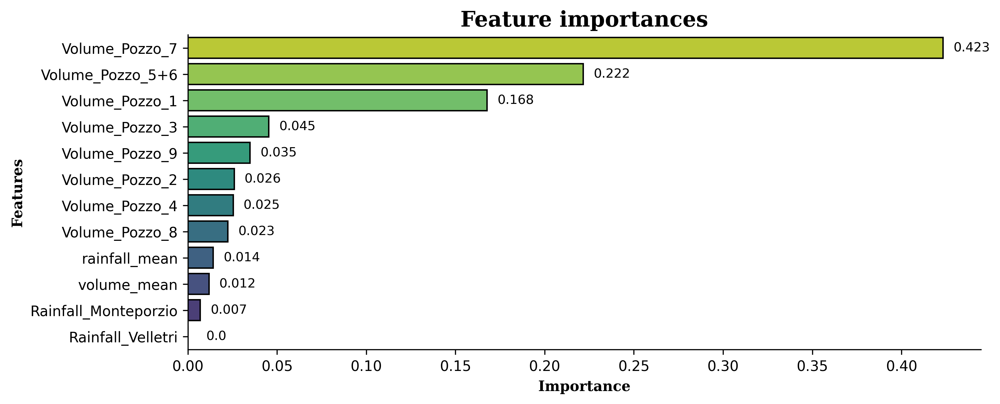

In [165]:
for i in range(9):
    print('{}'.format(y_train.columns[i]))
    model_imp_viz(model[i], X_train, bias = 0.016)

##Aquifer Luco (features)
The Luco wells field is fed by an underground aquifer. This aquifer not fed by rivers or lakes but by meteoric infiltration at the extremes of the impermeable sedimentary layers. Such aquifer is accessed through wells called Well 1, Well 3 and Well 4 and is influenced by the following parameters: rainfall, depth to groundwater, temperature and drainage volumes.


In [172]:
import pandas as pd

df = Aquifer_Luco.reset_index()
# The original format was causing the error. Specifying dayfirst=True or the correct format fixes it.
df['year'] = pd.to_datetime(df.Date, dayfirst=True).dt.year
#df['year'] = pd.to_datetime(df.Date, format='%d/%m/%Y').dt.year # Alternative solution if dayfirst=True doesn't work
df['month'] = pd.to_datetime(df.Date, dayfirst=True).dt.month
#df['month'] = pd.to_datetime(df.Date, format='%d/%m/%Y').dt.month # Alternative solution if dayfirst=True doesn't work

# Monthly dynamics
# The problem was here, the dates were being concatenated into a string.
# This line now correctly creates datetime objects and formats them.
df['month_year'] = pd.to_datetime(df.Date, dayfirst=True).apply(lambda x: x.strftime('%Y/%m'))
#df['month_year'] = pd.to_datetime(df.Date, format='%d/%m/%Y').apply(lambda x: x.strftime('%Y/%m')) # Alternative solution if dayfirst=True doesn't work

al_means = df.groupby('month_year').mean().reset_index()
# Convert 'month_year' back to datetime after the groupby
al_means['month_year'] = pd.to_datetime(al_means['month_year'])

rainfall_col = [col for col in al_means.columns if 'Rainfall' in col]
temperature_col = [col for col in al_means.columns if 'Temperature' in col]
volume_col = [col for col in al_means.columns if 'Volume' in col]
hydrometry_col = [col for col in al_means.columns if 'Hydrometry' in col]
groundwater_col = [col for col in al_means.columns if 'Depth_to_Groundwater' in col]

al_means['rainfall'] = al_means[rainfall_col].mean(axis = 1)

TypeError: agg function failed [how->mean,dtype->object]

NameError: name 'al_means' is not defined

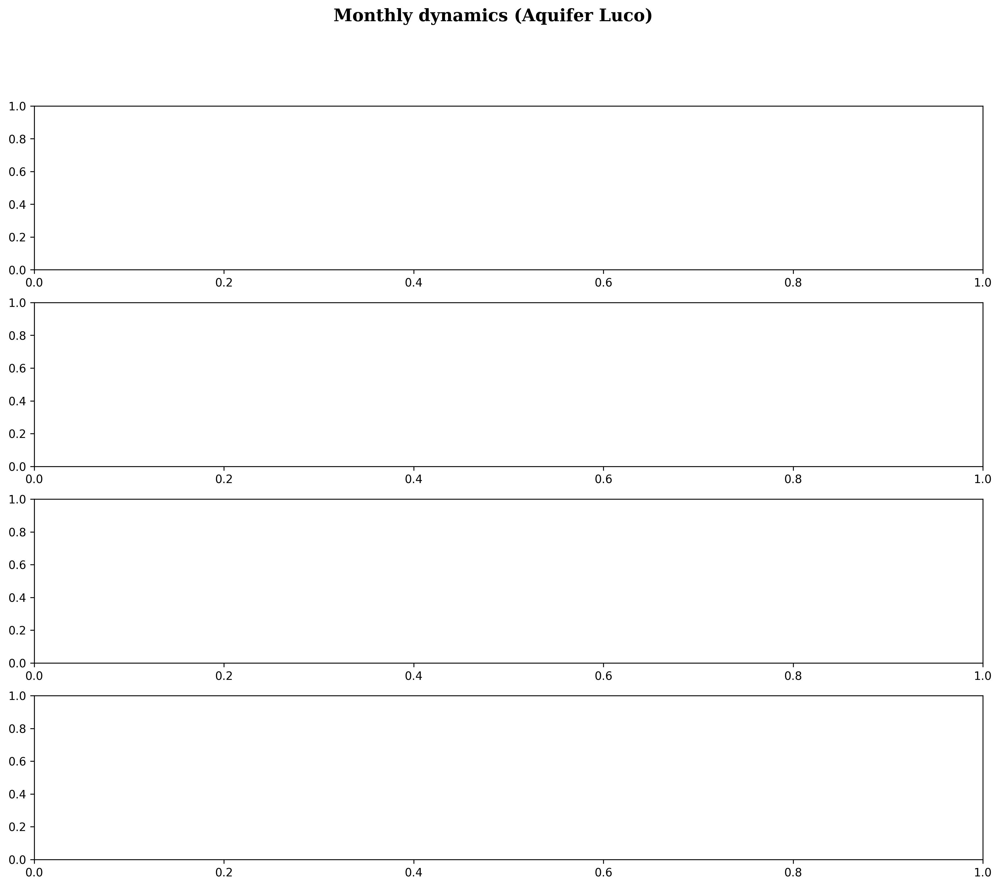

In [174]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize = (15, 12))
plt.suptitle('Monthly dynamics (Aquifer Luco)', size = 15, fontweight = 'bold', fontfamily = 'serif')

sns.lineplot(data = al_means, x = 'month_year', y = 'rainfall',
             color = 'blue', label = 'Rainfall', alpha = 0.7,
             ax = ax1)

for i in ['top', 'right', 'bottom', 'left']:
        ax1.spines[i].set_visible(False)

ax1.set_xticks(al_means.month_year[::12])
ax1.set_xticklabels(range(2000, 2021, 1), fontfamily = 'serif')
ax1.set_xlabel('')
ax1.set_ylabel('')
ax1.grid(axis = 'y', linestyle = '--', alpha = 0.9)



colors = ['#FF0800', '#A52A2A', '#FF00FF', '#FF6347']
n = 0
for i in temperature_col:
    sns.lineplot(data = al_means, x = 'month_year', y = i,
                 color = colors[n], label = i, alpha = 0.7,
                 ax = ax2)
    n +=1

for i in ['top', 'right', 'bottom', 'left']:
        ax2.spines[i].set_visible(False)

ax2.set_xticks(al_means.month_year[::12])
ax2.set_xticklabels(range(2000, 2021, 1), fontfamily = 'serif')
ax2.set_xlabel('')
ax2.set_ylabel('')
ax2.legend(bbox_to_anchor = (0.5, 0.1))
ax2.grid(axis = 'y', linestyle = '--', alpha = 0.9)



colors = ['#4E2A84', '#BF00FF', '#DE6FA1']
n = 0
for i in volume_col:
    sns.lineplot(data = al_means, x = 'month_year', y = i,
                 color = colors[n], label = i, alpha = 1,
                 ax = ax3)
    n += 1

for i in ['top', 'right', 'bottom', 'left']:
        ax3.spines[i].set_visible(False)

ax3.set_xticks(al_means.month_year[::12])
ax3.set_xticklabels(range(2000, 2021, 1), fontfamily = 'serif')
ax3.set_xlabel('')
ax3.set_ylabel('')
ax3.grid(axis = 'y', linestyle = '--', alpha = 0.9)



colors = ['#7FFFD4', '#00FFFF', '#03C03C', '#BFFF00']
n = 0
for i in groundwater_col:
    sns.lineplot(data = al_means, x = 'month_year', y = i,
                 color = colors[n], label = i, alpha = 1,
                 ax = ax4)
    n += 1

for i in ['top', 'right', 'bottom', 'left']:
        ax4.spines[i].set_visible(False)

ax4.set_xticks(al_means.month_year[::12])
ax4.set_xticklabels(range(2000, 2021, 1), fontfamily = 'serif')
ax4.set_xlabel('')
ax4.set_ylabel('')
ax4.grid(axis = 'y', linestyle = '--', alpha = 0.9)

plt.show()

The temperature dynamics have no obvious missing values, but some time periods for the two indicators have zero values that are missing values in the measurements. Volume features cover the time period from 2015 to 2020 and correlate with Depth to Groundwater features (especially with Depth_to_Groundwater_Podere_Casetta, predicted feature).

Also, high rainfall in 2013 and 2014 affected the depth to groundwater.

In [ ]:
# Yearly dynamics
al_means_y = df.groupby('year').mean().reset_index()
al_means_y['rainfall'] = al_means_y[rainfall_col].mean(axis = 1)

fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize = (15, 12))
plt.suptitle('Yearly dynamics (Aquifer Luco)', size = 15, fontweight = 'bold', fontfamily = 'serif')

sns.lineplot(data = al_means_y, x = 'year', y = 'rainfall',
             color = 'blue', label = 'Rainfall', alpha = 0.7,
             ax = ax1)

for i in ['top', 'right', 'bottom', 'left']:
        ax1.spines[i].set_visible(False)

ax1.set_xticks(al_means_y.year[::1])
ax1.set_xticklabels(range(2000, 2021, 1), fontfamily = 'serif')
ax1.set_xlabel('')
ax1.set_ylabel('')
ax1.grid(axis = 'y', linestyle = '--', alpha = 0.9)



colors = ['#FF0800', '#A52A2A', '#FF00FF', '#FF6347']
n = 0
for i in temperature_col:
    sns.lineplot(data = al_means_y, x = 'year', y = i,
                 color = colors[n], label = i, alpha = 0.7,
                 ax = ax2)
    n +=1

for i in ['top', 'right', 'bottom', 'left']:
        ax2.spines[i].set_visible(False)

ax2.set_xticks(al_means_y.year[::1])
ax2.set_xticklabels(range(2000, 2021, 1), fontfamily = 'serif')
ax2.set_xlabel('')
ax2.set_ylabel('')
ax2.legend(bbox_to_anchor = (0.5, 0.1))
ax2.grid(axis = 'y', linestyle = '--', alpha = 0.9)



colors = ['#4E2A84', '#BF00FF', '#DE6FA1']
n = 0
for i in volume_col:
    sns.lineplot(data = al_means_y, x = 'year', y = i,
                 color = colors[n], label = i, alpha = 1,
                 ax = ax3)
    n += 1

for i in ['top', 'right', 'bottom', 'left']:
        ax3.spines[i].set_visible(False)

ax3.set_xticks(al_means_y.year[::1])
ax3.set_xticklabels(range(2000, 2021, 1), fontfamily = 'serif')
ax3.set_xlabel('')
ax3.set_ylabel('')
ax3.grid(axis = 'y', linestyle = '--', alpha = 0.9)



colors = ['#7FFFD4', '#00FFFF', '#03C03C', '#BFFF00']
n = 0
for i in groundwater_col:
    sns.lineplot(data = al_means_y, x = 'year', y = i,
                 color = colors[n], label = i, alpha = 1,
                 ax = ax4)
    n += 1

for i in ['top', 'right', 'bottom', 'left']:
        ax4.spines[i].set_visible(False)

ax4.set_xticks(al_means_y.year[::1])
ax4.set_xticklabels(range(2000, 2021, 1), fontfamily = 'serif')
ax4.set_xlabel('')
ax4.set_ylabel('')
ax4.grid(axis = 'y', linestyle = '--', alpha = 0.9)

plt.show()

Depth_to_Groundwater_Pozzo 1, 2, and 4 only cover 3 years and are not suitable for forecasting.

##Aquifer Luco (prediction)
Base on the previous feature overview, we'll use for prediction the data from 2008 to 2018 (because there is no data for Depth_to_Groundwater_Podere_Casetta for the 2000-2007 time period). We'll also create 'rainfal_sum', 'temperature_mean' and 'volume_mean' features. Some columns with missing values will be dropped. Missing values will be fill by 'interpolate' method.

In [ ]:
AL_pred = Aquifer_Luco.iloc[2973:-547, :]
rainfall_col = ['Rainfall_Simignano', 'Rainfall_Montalcinello', 'Rainfall_Sovicille']
temperature_col = [col for col in AL_pred.columns if 'Temperature' in col]

AL_pred['rainfall_sum'] = AL_pred[rainfall_col].sum(axis = 1).values
AL_pred['temperature_mean'] = AL_pred[temperature_col].mean(axis = 1).values
AL_pred = AL_pred.drop(['Rainfall_Siena_Poggio_al_Vento', 'Rainfall_Mensano',
                        'Rainfall_Monticiano_la_Pineta', 'Rainfall_Ponte_Orgia',
                        'Rainfall_Scorgiano', 'Rainfall_Pentolina',
                        'Rainfall_Monteroni_Arbia_Biena',
                        'Depth_to_Groundwater_Pozzo_1', 'Depth_to_Groundwater_Pozzo_3',
                        'Depth_to_Groundwater_Pozzo_4', 'Temperature_Siena_Poggio_al_Vento',
                        'Temperature_Mensano', 'Volume_Pozzo_1',
                        'Volume_Pozzo_3', 'Volume_Pozzo_4'], axis = 1)
AL_pred = AL_pred.fillna(AL_pred.interpolate())

AL_pred

Then we'll split our data on a train (72%) and a test (28%) datasets without shuffling(!). Thus, we'll train the model on data obtained before 2015 and check it on data for 2016-2018.

I chose XGB as the most popular, and one of the most powerful algorithms. It also does not require data normalization. Parameters for the model were chosen after some experiments.

In [ ]:
y = AL_pred['Depth_to_Groundwater_Podere_Casetta']
X = AL_pred.drop('Depth_to_Groundwater_Podere_Casetta', axis = 1)

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.7274, shuffle = False)

In [ ]:
params = {'n_estimators': 200,
          'max_depth': 2,
          'subsample': 1,
          'learning_rate': 0.03,
          'random_state': 0}

model = XGBRegressor(**params)

model.fit(X_train, y_train)

In [ ]:
y_pred = model.predict(X_test)

print('MAE value (Depth_to_Groundwater_Podere_Casetta): %.4f'
      %mean_absolute_error(y_test, y_pred))

The mean absolute error of the predicted values is 0.65, which means that, on average, our model make a mistake by 0.65 meters. This is not a bad result, but the dynamics of values may not look so good.

Let's look at the feature importances.

In [ ]:
model_imp_viz(model, X_train, bias = 0.016)

In [ ]:
predicted_viz(y_test, y_pred, 'Depth_to_Groundwater_Podere_Casetta', 'Aquifer Luco')

As expected. Some periods are predicted to within a meter or even more, which is no longer a good result.